# This notebook is used for RV illustrations. 
## Created by Chenyang Ji in 2024.11.28.
## Modified by Chenyang Ji in 2024.12.17 for paper.
---
### Containing four situations:
1. Only photon noises, including Poisson noise and read noise.
2. Only cal-sci contamination, without photon noise and sci-sci contamination.
3. Only sci-sci contamination, without photon noise and sci-sci contamination.
4. CHORUS setting, including photon noises and cross-contamination according to instrumental setup.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
pwd = os.path.dirname(os.path.abspath(os.getcwd()))
pwd

'/mnt/beegfs_data/work/joanneji/CHORUS_work'

In [3]:
# order information
order_num_blue = np.arange(86, 114, 1)
order_num_red = np.arange(60, 87, 1)
order_num = {'red': order_num_red, 'blue': order_num_blue}
order = np.concatenate([order_num['blue'], order_num['red']])

In [4]:
# define median absolute deviation
def mad(data, axis=None):
    median = np.median(data, axis=axis)
    # make median into a vector according to the axis
    if axis is not None:
        median = np.expand_dims(median, axis=axis)
    return np.median(np.abs(data - median), axis=axis)

a = [[1, 2, 3], [4, 6, 7]]
mad(a, axis=1)

array([1., 1.])

In [5]:
# a = np.ones((100, len(order_num_red), 3))
a = np.array([[[1, 2], [2, 3] ,[3, 4]],
     [[5, 6], [7, 8] ,[9, 0]]])
print(np.shape(a), a[0, :, :])
# Split the array along the last axis and concatenate
# a1 = np.concatenate([a[:, :, i] for i in [range(2)]], axis=1)
a1 = np.hstack([a[:, :, i] for i in range(2)])
# should be (100, 27*3)
a2 = np.median(a1, axis=1)
print(a1)
print(a2)

(2, 3, 2) [[1 2]
 [2 3]
 [3 4]]
[[1 2 3 2 3 4]
 [5 7 9 6 8 0]]
[2.5 6.5]


## 1. Only photon noises.

SNR=100, RV median in the red band: 0.0047173657170573435m/s, std: 0.4847160968610895m/s
SNR=100, RV median in the blue band: 0.017234085429192633m/s, std: 0.2296618792716984m/s


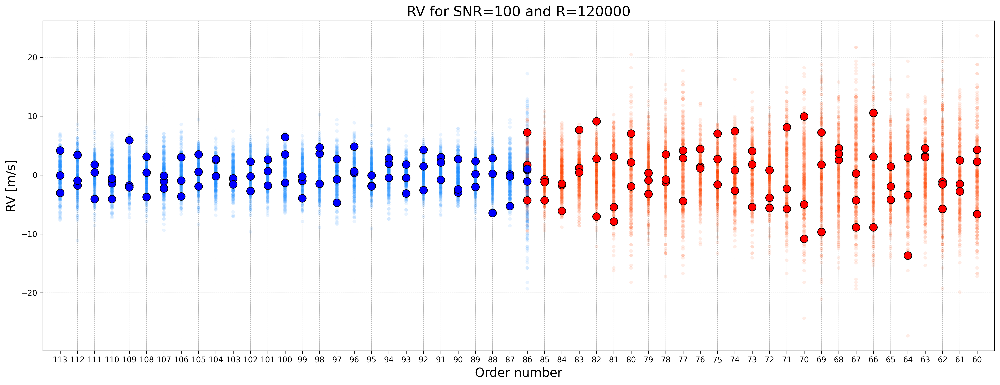

In [6]:
SNR_values = [100, 200, 300, 400, 500, 600, 700, 800, 1200, 2000]
R_values = [10000, 30000, 60000, 90000, 120000, 150000]
nspec = 100

# load and plot SNR=100
snr = 100
R = 120000
rv_all_red = np.zeros((nspec, len(order_num_red), 3))
rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
plt.figure(figsize=(18, 7), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
    filename = f"{R}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_red[ispec, :, :] = rv
    # mark the first observation
    if ispec == 0:
        plt.scatter(order_num['red'], rv[:, 0], s=100, edgecolors='black', linewidths=0.8, c='red', zorder=5)
        plt.scatter(order_num['red'], rv[:, 1], s=100, edgecolors='black', linewidths=0.8, c='red', zorder=5)
        plt.scatter(order_num['red'], rv[:, 2], s=100, edgecolors='black', linewidths=0.8, c='red', zorder=5)
    else:
        plt.scatter(order_num['red'], rv[:, 0], s=20, edgecolors='none', c='orangered', alpha=0.1, zorder=3)
        plt.scatter(order_num['red'], rv[:, 1], s=20, edgecolors='none', c='orangered', alpha=0.1, zorder=3)
        plt.scatter(order_num['red'], rv[:, 2], s=20, edgecolors='none', c='orangered', alpha=0.1, zorder=3)
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
    filename = f"{R}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_blue[ispec, :, :] = rv
    # mark the first observation
    if ispec == 0:
        plt.scatter(order_num['blue'], rv[:, 0], s=100, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
        plt.scatter(order_num['blue'], rv[:, 1], s=100, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
        plt.scatter(order_num['blue'], rv[:, 2], s=100, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
    else:
        plt.scatter(order_num['blue'], rv[:, 0], s=20, edgecolors='none', c='dodgerblue', alpha=0.1, zorder=3)
        plt.scatter(order_num['blue'], rv[:, 1], s=20, edgecolors='none', c='dodgerblue', alpha=0.1, zorder=3)
        plt.scatter(order_num['blue'], rv[:, 2], s=20, edgecolors='none', c='dodgerblue', alpha=0.1, zorder=3)

# concatenate the red band into the shape of (nspec*3, len(order)), joining 3 traces for one order
# calculate the median and std of each order, combining three traces for one order
# red band
rv_all_red_transformed = np.hstack(rv_all_red[:, :, :])
rv_median_red = np.median(rv_all_red_transformed, axis=1)
rv_std_red = np.std(rv_all_red_transformed, axis=1)
# plt.errorbar(order_num['red'], rv_median_red, yerr=rv_std_red, fmt='o', color='red', ms=10, elinewidth=2, capsize=3, capthick=2, label='Red band', zorder=5)
# blue band
rv_all_blue_transformed = np.hstack(rv_all_blue[:, :, :])
rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
rv_std_blue = np.std(rv_all_blue_transformed, axis=1)
# plt.errorbar(order_num['blue'], rv_median_blue, yerr=rv_std_blue, fmt='o', color='blue', ms=10, elinewidth=2, capsize=3, capthick=2, label='Blue band', zorder=5)

print(f"SNR={snr}, RV median in the red band: {np.median(rv_median_red)}m/s, std: {np.std(rv_median_red)}m/s")
print(f"SNR={snr}, RV median in the blue band: {np.median(rv_median_blue)}m/s, std: {np.std(rv_median_blue)}m/s")

# plt.yscale('log')
# plt.ylim(-5, 5)
plt.xlim(59, 114)
plt.gca().invert_xaxis()
plt.xticks(order, fontsize=10);  # Suppress output
plt.xlabel('Order number', fontsize=16);
plt.ylabel('RV [m/s]', fontsize=16);
plt.title(f"RV for SNR={snr} and R={R}", fontsize=18);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.tight_layout()

SNR=600, RV median in the red band: 0.011453611278678945m/s, std: 0.05675570703915508m/s
SNR=600, RV median in the blue band: 0.012493618080157714m/s, std: 0.028152266654644768m/s


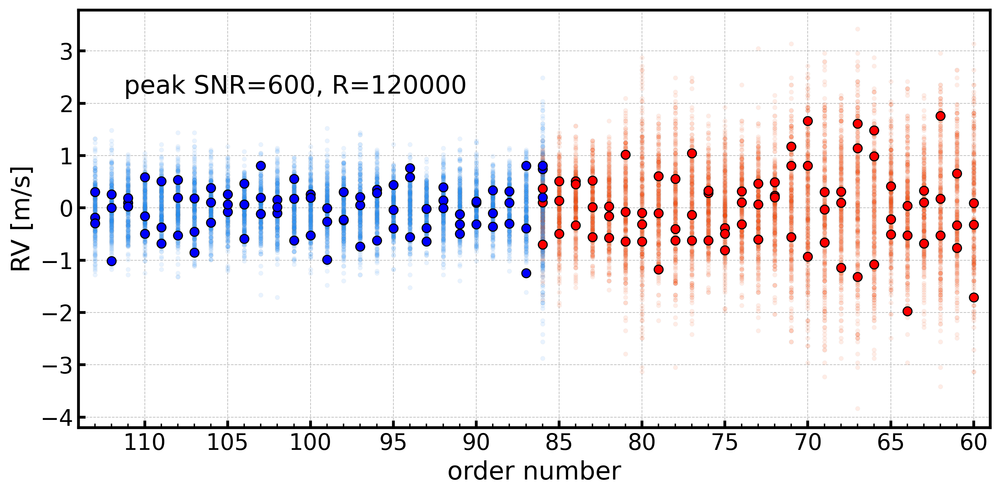

In [ ]:
SNR_values = [100, 200, 300, 400, 500, 600, 700, 800, 1200, 2000]
R_values = [10000, 30000, 60000, 90000, 120000, 150000]
nspec = 100

# load and plot SNR=600
snr = 600
R = 120000
rv_all_red = np.zeros((nspec, len(order_num_red), 3))
rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
plt.figure(figsize=(10, 5), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
    filename = f"{R}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_red[ispec, :, :] = rv
    # mark the first observation
    if ispec == 0:
        plt.scatter(order_num['red'], rv[:, 0], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
        plt.scatter(order_num['red'], rv[:, 1], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
        plt.scatter(order_num['red'], rv[:, 2], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
    else:
        plt.scatter(order_num['red'], rv[:, 0], s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
        plt.scatter(order_num['red'], rv[:, 1], s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
        plt.scatter(order_num['red'], rv[:, 2], s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
    filename = f"{R}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_blue[ispec, :, :] = rv
    # mark the first observation
    if ispec == 0:
        plt.scatter(order_num['blue'], rv[:, 0], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
        plt.scatter(order_num['blue'], rv[:, 1], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
        plt.scatter(order_num['blue'], rv[:, 2], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
    else:
        plt.scatter(order_num['blue'], rv[:, 0], s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)
        plt.scatter(order_num['blue'], rv[:, 1], s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)
        plt.scatter(order_num['blue'], rv[:, 2], s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)

# concatenate the red band into the shape of (nspec*3, len(order)), joining 3 traces for one order
# calculate the median and std of each order, combining three traces for one order
# red band
rv_all_red_transformed = np.hstack(rv_all_red[:, :, :])
rv_median_red = np.median(rv_all_red_transformed, axis=1)
rv_std_red = np.std(rv_all_red_transformed, axis=1)
# plt.errorbar(order_num['red'], rv_median_red, yerr=rv_std_red, fmt='o', color='red', ms=10, elinewidth=2, capsize=3, capthick=2, label='Red band', zorder=5)
# blue band
rv_all_blue_transformed = np.hstack(rv_all_blue[:, :, :])
rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
rv_std_blue = np.std(rv_all_blue_transformed, axis=1)
# plt.errorbar(order_num['blue'], rv_median_blue, yerr=rv_std_blue, fmt='o', color='blue', ms=10, elinewidth=2, capsize=3, capthick=2, label='Blue band', zorder=5)

print(f"SNR={snr}, RV median in the red band: {np.median(rv_median_red)}m/s, std: {np.std(rv_median_red)}m/s")
print(f"SNR={snr}, RV median in the blue band: {np.median(rv_median_blue)}m/s, std: {np.std(rv_median_blue)}m/s")

# Major and minor x-ticks
order = np.arange(110, 59, -5)  # Major ticks
plt.xticks(order, fontsize=16)
plt.yticks(fontsize=16)
plt.gca().xaxis.set_minor_locator(plt.FixedLocator(np.linspace(60, 113, 27+27)))  # Minor ticks

# Tick formatting
plt.tick_params(axis='x', which='major', direction='in', width=2, length=5)  # Major ticks inside
plt.tick_params(axis='x', which='minor', direction='in', width=1, length=3)  # Minor ticks inside
plt.tick_params(axis='y', which='both', direction='in', width=2, length=5)  # y-ticks inside

# Thicker outer boundary
for spine in plt.gca().spines.values():
    spine.set_linewidth(2)

# Axis limits and inversion
plt.xlim(59, 114)
plt.gca().invert_xaxis()

# Labels and title
plt.xlabel('order number', fontsize=18)
plt.ylabel('RV [m/s]', fontsize=18)

# annotate the SNR and R value
plt.annotate(f"peak SNR={snr}, R={R}", xy=(0.05, 0.8), xycoords='axes fraction', fontsize=18)

# Grid formatting
plt.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/scattered.png'), dpi=300)
plt.show()


In [10]:
# extract RV precision information
def rv_precision(snr_values, R):

    pre_red = np.zeros_like(snr_values, dtype=float)
    pre_blue = np.zeros_like(snr_values, dtype=float)

    for i, snr in enumerate(snr_values):
        rv_all_red = np.zeros((nspec, len(order_num_red), 3))
        rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
        for ispec in range(nspec):
            output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
            filename = f"{R}_{ispec}_red.npz"
            filepath = os.path.join(output_folder, filename)
            data = np.load(filepath)
            rv = data['RV']
            rv_all_red[ispec, :, :] = rv
        for ispec in range(nspec):
            output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
            filename = f"{R}_{ispec}_blue.npz"
            filepath = os.path.join(output_folder, filename)
            data = np.load(filepath)
            rv = data['RV']
            rv_all_blue[ispec, :, :] = rv
        # red
        rv_all_red_transformed = np.hstack([rv_all_red[:, :, j] for j in range(3)])  # with shape (nspec, len(order)*3)
        rv_median_red = np.median(rv_all_red_transformed, axis=1)  # with shape (nspec,)
        # blue
        rv_all_blue_transformed = np.hstack([rv_all_blue[:, :, j] for j in range(3)])
        rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
        # precision
        # std
        pre_red[i] = np.std(rv_median_red)
        pre_blue[i] = np.std(rv_median_blue)
        # MAD
        # pre_red[i] = mad(rv_median_red)
        # pre_blue[i] = mad(rv_median_blue)

    return pre_red, pre_blue

pre_red_1, pre_blue_1 = rv_precision(SNR_values, 10000)
pre_red_3, pre_blue_3 = rv_precision(SNR_values, 30000)
pre_red_6, pre_blue_6 = rv_precision(SNR_values, 60000)
pre_red_9, pre_blue_9 = rv_precision(SNR_values, 90000)
pre_red_12, pre_blue_12 = rv_precision(SNR_values, 120000)
pre_red_15, pre_blue_15 = rv_precision(SNR_values, 150000)

KeyboardInterrupt: 

In [8]:
np.savez('rv_precision.npz', SNR_values=SNR_values, pre_red_9=pre_red_9, pre_blue_9=pre_blue_9, pre_red_12=pre_red_12, pre_blue_12=pre_blue_12, pre_red_15=pre_red_15, pre_blue_15=pre_blue_15)

R=120k, RV precision at SNR=100: red band: 0.5021975805197825m/s, blue band: 0.24556224821182054m/s


/tmp/ipykernel_1504175/2957171058.py:12: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "^-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(SNR_values, pre_red_9, '^-', label='R=90k', color='r', linestyle='--', linewidth=1, ms=5, alpha=0.6, zorder=3)
/tmp/ipykernel_1504175/2957171058.py:13: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "^-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(SNR_values, pre_blue_9, '^-', label='R=90k', color='b', linestyle='--', linewidth=1, ms=5, alpha=0.6, zorder=3)
/tmp/ipykernel_1504175/2957171058.py:14: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "s-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(SNR_values, pre_red_15, 's-', label='R=150k', color='r', linestyle='-.', linewidth=1, ms=5, alpha=0.6, zorder=3)
/

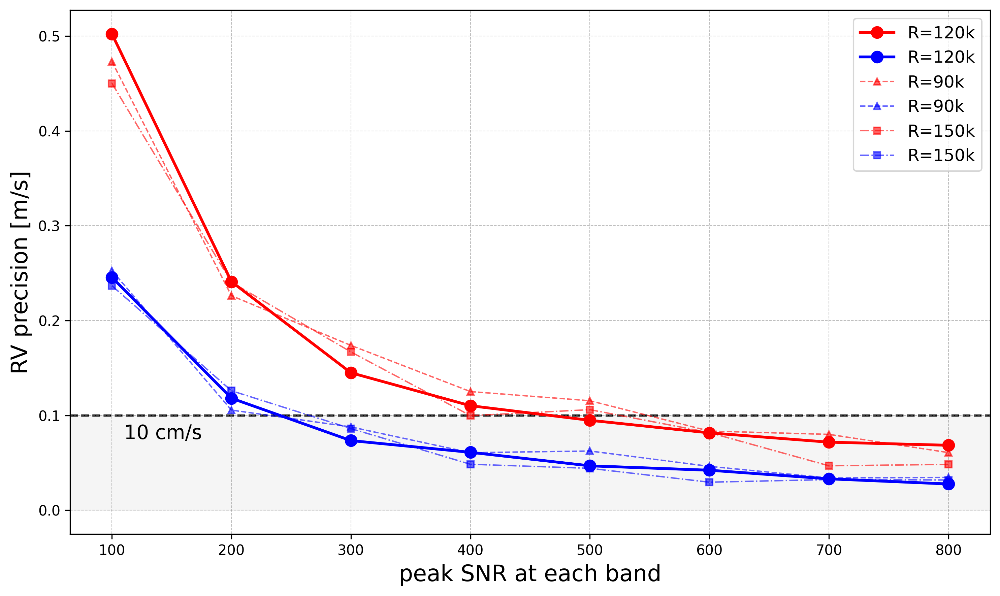

In [26]:
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(SNR_values, pre_red_12, 'o-', label='R=120k', color='r', linewidth=2, ms=8, zorder=5)
plt.plot(SNR_values, pre_blue_12, 'o-', label='R=120k', color='b', linewidth=2, ms=8, zorder=5)
print(f"R=120k, RV precision at SNR=100: red band: {pre_red_12[0]}m/s, blue band: {pre_blue_12[0]}m/s")

# plt.plot(SNR_values, pre_red_1, '<-', label='R=10k', color='r', linestyle='-', linewidth=1, ms=5, alpha=0.6, zorder=3)
# plt.plot(SNR_values, pre_blue_1, '<-', label='R=10k', color='b', linestyle='-', linewidth=1, ms=5, alpha=0.6, zorder=3)
# plt.plot(SNR_values, pre_red_3, '*-', label='R=30k', color='r', linestyle='-', linewidth=1, ms=5, alpha=0.6, zorder=3)
# plt.plot(SNR_values, pre_blue_3, '*-', label='R=30k', color='b', linestyle='-', linewidth=1, ms=5, alpha=0.6, zorder=3)
# plt.plot(SNR_values, pre_red_6, '>-', label='R=60k', color='r', linestyle=':', linewidth=1, ms=5, alpha=0.6, zorder=3)
# plt.plot(SNR_values, pre_blue_6, '>-', label='R=60k', color='b', linestyle=':', linewidth=1, ms=5, alpha=0.6, zorder=3)
plt.plot(SNR_values, pre_red_9, '^-', label='R=90k', color='r', linestyle='--', linewidth=1, ms=5, alpha=0.6, zorder=3)
plt.plot(SNR_values, pre_blue_9, '^-', label='R=90k', color='b', linestyle='--', linewidth=1, ms=5, alpha=0.6, zorder=3)
plt.plot(SNR_values, pre_red_15, 's-', label='R=150k', color='r', linestyle='-.', linewidth=1, ms=5, alpha=0.6, zorder=3)
plt.plot(SNR_values, pre_blue_15, 's-', label='R=150k', color='b', linestyle='-.', linewidth=1, ms=5, alpha=0.6, zorder=3)

# mark <10cm/s area
plt.axhspan(0, 0.1, color='whitesmoke', zorder=0)
# plt.text(125, 0.04, 'ideal', fontsize=14, color='orange')
plt.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(110, 0.075, '10 cm/s', fontsize=14, color='k', zorder=10)

plt.xticks(SNR_values, fontsize=10);  # Suppress output
plt.xlabel('peak SNR at each band', fontsize=16);
plt.ylabel('RV precision [m/s]', fontsize=16);
# plt.title(f"RV precision for different R", fontsize=18);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
# plt.ylim(0, 0.5)
plt.legend(fontsize=12)
plt.tight_layout()


In [13]:
# create a matrix to store the RV precision for different R and SNR
pre_red = np.concatenate([pre_red_1[:, np.newaxis], pre_red_3[:, np.newaxis], pre_red_6[:, np.newaxis], pre_red_9[:, np.newaxis], pre_red_12[:, np.newaxis], pre_red_15[:, np.newaxis]], axis=1)
pre_blue = np.concatenate([pre_blue_1[:, np.newaxis], pre_blue_3[:, np.newaxis], pre_blue_6[:, np.newaxis], pre_blue_9[:, np.newaxis], pre_blue_12[:, np.newaxis], pre_blue_15[:, np.newaxis]], axis=1)

np.savez('rv_precision_matrix.npz', SNR_values=SNR_values, R_values=R_values, pre_red=pre_red, pre_blue=pre_blue)

NameError: name 'pre_red_1' is not defined

In [17]:
# create a matrix to store the RV precision for different R and SNR
pre_red = np.concatenate([pre_red_1[:, np.newaxis], pre_red_3[:, np.newaxis], pre_red_6[:, np.newaxis], pre_red_9[:, np.newaxis], pre_red_12[:, np.newaxis], pre_red_15[:, np.newaxis]], axis=1)
pre_blue = np.concatenate([pre_blue_1[:, np.newaxis], pre_blue_3[:, np.newaxis], pre_blue_6[:, np.newaxis], pre_blue_9[:, np.newaxis], pre_blue_12[:, np.newaxis], pre_blue_15[:, np.newaxis]], axis=1)

np.savez('rv_precision_matrix_mad.npz', SNR_values=SNR_values, R_values=R_values, pre_red=pre_red, pre_blue=pre_blue)

In [13]:
data = np.load('rv_precision_matrix.npz')
pre_red, pre_blue = data['pre_red'], data['pre_blue']
pre_red.shape

(10, 6)

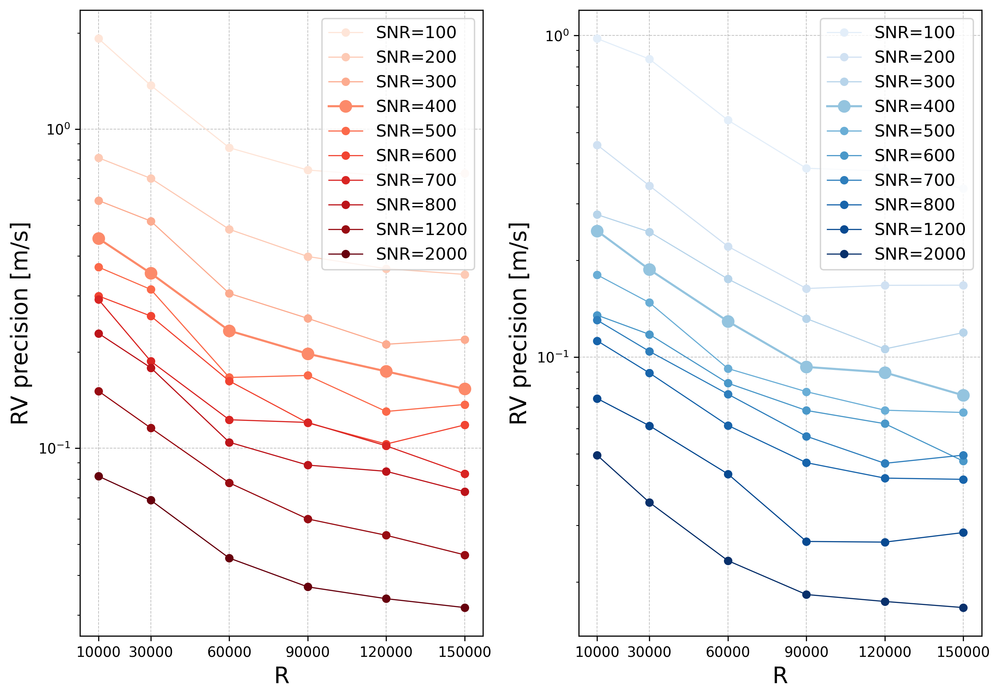

In [15]:
# plot RV precision for different R in two separate subplots
plt.figure(figsize=(10, 7), dpi=300)
for i, isnr in enumerate(SNR_values):
    color_red = plt.cm.Reds((i+1)/len(SNR_values))
    color_blue = plt.cm.Blues((i+1)/len(SNR_values))
    plt.subplot(1, 2, 1)
    if isnr == 400:
        plt.plot(R_values, pre_red[i, :], 'o-', label=f'SNR={isnr}', color=color_red, linewidth=1.5, ms=8, zorder=5)
    else:
        plt.plot(R_values, pre_red[i, :], 'o-', label=f'SNR={isnr}', color=color_red, linewidth=0.8, ms=5, zorder=5)
    plt.subplot(1, 2, 2)
    if isnr == 400:
        plt.plot(R_values, pre_blue[i, :], 'o-', label=f'SNR={isnr}', color=color_blue, linewidth=1.5, ms=8, zorder=5)
    else:
        plt.plot(R_values, pre_blue[i, :], 'o-', label=f'SNR={isnr}', color=color_blue, linewidth=0.8, ms=5, zorder=5)

plt.subplot(1, 2, 1)
plt.yscale('log')
plt.xticks(R_values, fontsize=10);  # Suppress output
plt.xlabel('R', fontsize=16);
plt.ylabel('RV precision [m/s]', fontsize=16);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.legend(fontsize=12)
plt.subplot(1, 2, 2)
plt.yscale('log')
plt.xticks(R_values, fontsize=10);  # Suppress output
plt.xlabel('R', fontsize=16);
plt.ylabel('RV precision [m/s]', fontsize=16);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.legend(fontsize=12)
plt.tight_layout()

/tmp/ipykernel_1990613/2635917952.py:27: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(0, 1)
/tmp/ipykernel_1990613/2635917952.py:36: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(0, 1)


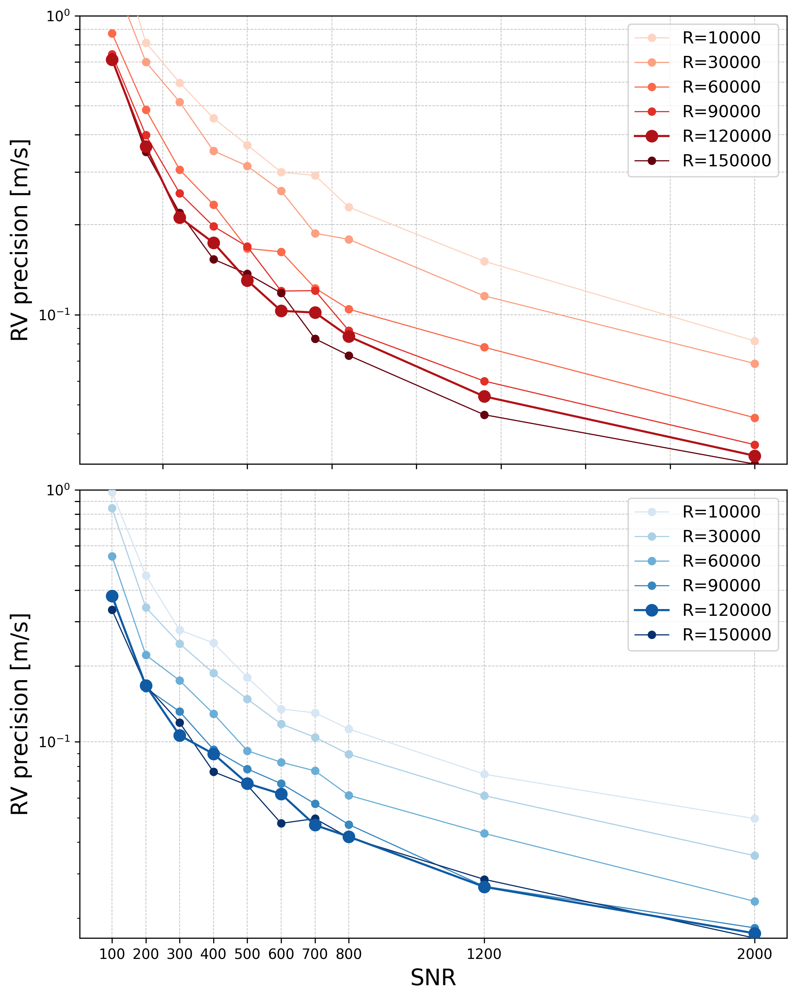

In [16]:
# plot RV precision for different SNR in two separate subplots
plt.figure(figsize=(8, 10), dpi=300)
for i, iR in enumerate(R_values):
    color_red = plt.cm.Reds((i+1)/len(R_values))
    color_blue = plt.cm.Blues((i+1)/len(R_values))
    plt.subplot(2, 1, 1)
    if iR == 120000:
        plt.plot(SNR_values, pre_red[:, i], 'o-', linewidth=1.5, label=f'R={iR}', color=color_red, ms=8, zorder=10)
    else:
        plt.plot(SNR_values, pre_red[:, i], 'o-', linewidth=0.8, label=f'R={iR}', color=color_red, ms=5, zorder=5)
    plt.subplot(2, 1, 2)
    if iR == 120000:
        plt.plot(SNR_values, pre_blue[:, i], 'o-', linewidth=1.5, label=f'R={iR}', color=color_blue, ms=8, zorder=10)
    else:
        plt.plot(SNR_values, pre_blue[:, i], 'o-', linewidth=0.8, label=f'R={iR}', color=color_blue, ms=5, zorder=5)

plt.subplot(2, 1, 1)
# remove the first tick label
plt.gca().axes.get_xaxis().set_ticklabels([])
# remove the separation between the two subplots
plt.subplots_adjust(hspace=0)
# plt.xticks(SNR_values, fontsize=10);  # Suppress output
# plt.xlabel('SNR', fontsize=16);
plt.yscale('log')
plt.ylabel('RV precision [m/s]', fontsize=16);
plt.yticks(np.arange(0, 1.1, 0.1), fontsize=10)
plt.ylim(0, 1)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.legend(fontsize=12)
plt.subplot(2, 1, 2)
plt.yscale('log')
plt.xticks(SNR_values, fontsize=10);  # Suppress output
plt.xlabel('SNR', fontsize=16);
plt.ylabel('RV precision [m/s]', fontsize=16);
plt.yticks(np.arange(0, 1.1, 0.1), fontsize=10)
plt.ylim(0, 1)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.legend(fontsize=12)
plt.tight_layout()

A relation between RV precision and SNR according to Bottom et al. 2013:
$$\sigma_\mathrm{RV} \propto R^{-1.2}$$

/tmp/ipykernel_2000230/2870464034.py:7: RuntimeWarning: invalid value encountered in power
  return (a * np.array(R) + b)**(-1.2)


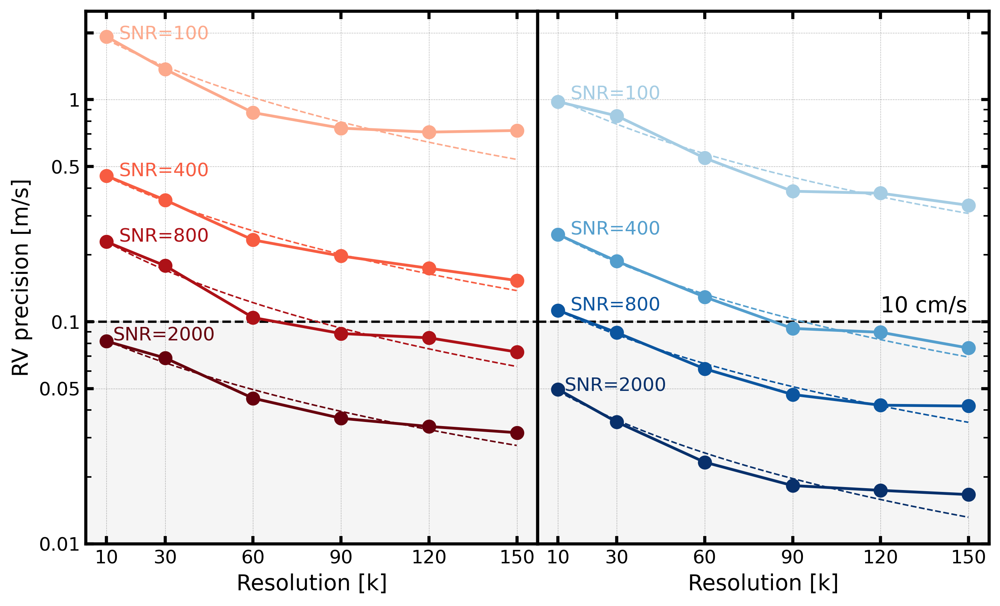

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.optimize import curve_fit
import numpy as np

def Bottom13(R, a, b):
    return (a * np.array(R) + b)**(-1.2)

rms_red = np.zeros(len(SNR_values))
rms_blue = np.zeros(len(SNR_values))

# Plot setup with shared y-axis and no space between subplots
fig, axes = plt.subplots(1, 2, figsize=(9, 5.5), dpi=300, sharey=True, gridspec_kw={'wspace': 0, 'hspace': 0})

for i, isnr in enumerate(SNR_values):
    color_red = plt.cm.Reds((i + 4) / (len(SNR_values)+3))
    color_blue = plt.cm.Blues((i + 5) / (len(SNR_values)+4))

    # Left subplot: Red band
    ax = axes[0]
    popt_red, _ = curve_fit(Bottom13, R_values, pre_red[i, :], maxfev=2000)
    if isnr in [400, 100, 800, 2000]:
        ax.plot(R_values, pre_red[i, :], 'o-', label=f'SNR={isnr}', color=color_red, linewidth=1.8, ms=8)
        ax.plot(np.arange(1e4, 15e4, 100), Bottom13(np.arange(1e4, 15e4, 100), *popt_red), linestyle='--', linewidth=1, color=color_red)
        ax.annotate(f"SNR={isnr}", (R_values[0] + 17000, Bottom13(1e4, *popt_red)), textcoords="offset points", xytext=(5, 0), ha='center', color=color_red, fontsize=12)
    rms_red[i] = np.sqrt(np.sum(((pre_red[i, :] - Bottom13(R_values, *popt_red))**2) / len(R_values)))

    # Right subplot: Blue band
    ax = axes[1]
    popt_blue, _ = curve_fit(Bottom13, R_values, pre_blue[i, :], maxfev=2000)
    if isnr in [400, 100, 800, 2000]:
        ax.plot(R_values, pre_blue[i, :], 'o-', label=f'SNR={isnr}', color=color_blue, linewidth=1.8, ms=8)
        ax.plot(np.arange(1e4, 15e4, 100), Bottom13(np.arange(1e4, 15e4, 100), *popt_blue), linestyle='--', linewidth=1, color=color_blue)
        ax.annotate(f"SNR={isnr}", (R_values[0] + 17000, Bottom13(1e4, *popt_blue)), textcoords="offset points", xytext=(5, 0), ha='center', color=color_blue, fontsize=12)
    rms_blue[i] = np.sqrt(np.sum(((pre_blue[i, :] - Bottom13(R_values, *popt_blue))**2) / len(R_values)))

# fill the < 0.1m/s area
for ax in axes:
    ax.axhspan(0.01, 0.1, color='whitesmoke', zorder=0)
    ax.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
axes[1].annotate('10 cm/s', xy=(12e4, 0.11), fontsize=14, color='k', zorder=10)

# Formatting for both subplots
for ax in axes:
    ax.set_yscale('log')
    ax.set_yticks([0.01, 0.05, 0.1, 0.5, 1, 2])
    ax.set_yticklabels([0.01, 0.05, 0.1, 0.5, 1, ''], fontsize=12)
    ax.set_ylim(0.01, 2.5)
    ax.set_xticks(R_values)
    ax.set_xticklabels([f"{x/1000:.0f}" for x in R_values], fontsize=12)
    ax.tick_params(axis='both', which='major', width=2, length=5, direction='in')  # Thicker ticks
    ax.tick_params(axis='both', which='minor', width=1, length=3.5, direction='in')  # Thicker ticks
    ax.grid(True, linestyle='--', color='k', linewidth=0.3, alpha=0.3)

# Left plot adjustments
axes[0].set_xlabel('Resolution [k]', fontsize=14)
axes[0].set_ylabel('RV precision [m/s]', fontsize=14)

# Right plot adjustments
axes[1].tick_params(left=False, labelleft=False)  # Remove left y-axis labels and ticks

# Move right y-ticks to the right side without labels
axes[1].yaxis.tick_right()
axes[1].tick_params(axis='y', which='both', labelright=False)  # Keep ticks but hide labels
axes[1].set_xlabel('Resolution [k]', fontsize=14)

# Add ticks on the top for both subplots (hide labels)
for ax in axes:
    ax.tick_params(axis='x', which='both', top=True, labeltop=False)

# Thicker outer boundary for each subplot
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)

plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/std_resolution.png'), dpi=300)
plt.show()


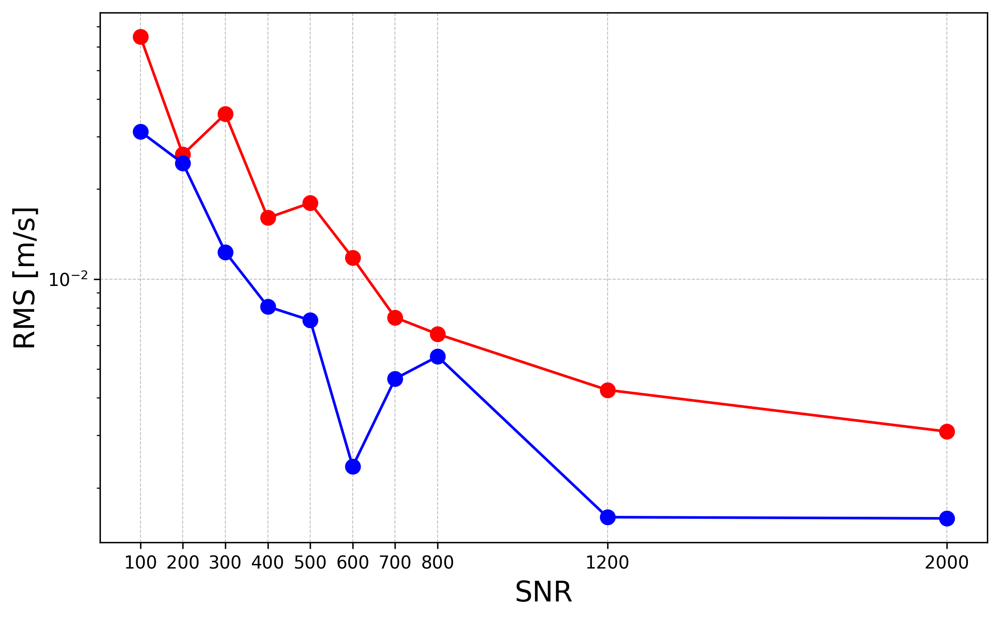

In [14]:
# plot rms v.s. SNR
plt.figure(figsize=(8, 5), dpi=300)
plt.plot(SNR_values, rms_red, 'o-', color='r', linewidth=1.5, ms=8, zorder=5)
plt.plot(SNR_values, rms_blue, 'o-', color='b', linewidth=1.5, ms=8, zorder=5)
plt.yscale('log')
plt.xticks(SNR_values, fontsize=10);  # Suppress output
plt.xlabel('SNR', fontsize=16);
plt.ylabel('RMS [m/s]', fontsize=16);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.tight_layout()


### RV precision v.s. SNR

In [65]:
mean_SNR_red = np.zeros(len(SNR_values))
mean_SNR_blue = np.zeros(len(SNR_values))

# the real SNR
for i, isnr in enumerate(SNR_values):
# for i, isnr in enumerate([100]):
    # red
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{isnr}")
    filename = f"{R}_0_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    flux = data['flux']
    order_SNR = np.sqrt(flux)
    # print(np.shape(order_SNR))
    median_SNR = np.mean(np.median(np.median(order_SNR, axis=2), axis=1))
    mean_SNR_red[i] = median_SNR
    # print(f"red: peak SNR at {isnr}, median SNR around {median_SNR:.0f}")
    # blue
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{isnr}")
    filename = f"{R}_0_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    flux = data['flux']
    order_SNR = np.sqrt(flux)
    median_SNR = np.mean(np.median(np.median(order_SNR, axis=2), axis=1))
    mean_SNR_blue[i] = median_SNR
    # print(f"blue: peak SNR at {isnr}, median SNR around {median_SNR:.0f}")

print(mean_SNR_red[0:8])
print(mean_SNR_blue[0:8])

[ 84.48641242 168.99852236 253.50365067 337.99451776 422.50062394
 507.01328878 591.50034002 675.9999384 ]
[ 60.38590027 120.78287084 181.17178065 241.56830747 301.99330312
 362.37755634 422.75106958 483.16868639]


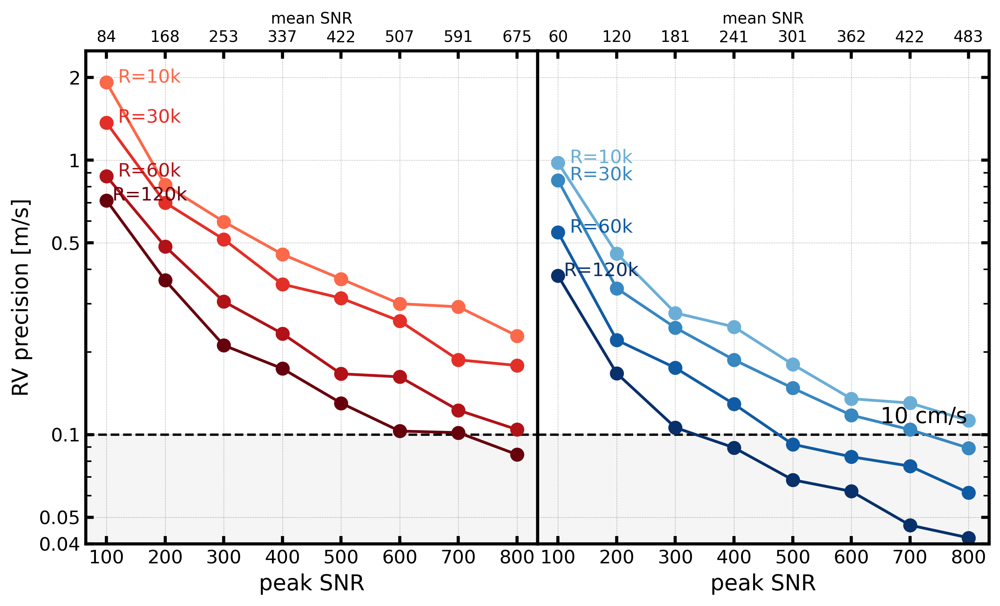

In [77]:
# Plot setup with shared y-axis and no space between subplots
fig, axes = plt.subplots(1, 2, figsize=(9, 5.5), dpi=300, sharey=True, gridspec_kw={'wspace': 0, 'hspace': 0})

for i, iR in enumerate(R_values):
    color_red = plt.cm.Reds((i + 3) / (len(R_values)))
    color_blue = plt.cm.Blues((i + 3) / (len(R_values)))

    # Left subplot: Red band
    ax = axes[0]
    if iR in [10000, 30000, 60000, 120000]:
        ax.plot(np.arange(100, 801, 100), pre_red[0:8, i], 'o-', label=f'R={iR}', color=color_red, linewidth=1.8, ms=8)
        ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_red[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_red, fontsize=12)

    # Right subplot: Blue band
    ax = axes[1]
    if iR in [10000, 30000, 60000, 120000]:
        ax.plot(np.arange(100, 801, 100), pre_blue[0:8, i], 'o-', label=f'R={iR}', color=color_blue, linewidth=1.8, ms=8)
        ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_blue[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_blue, fontsize=12)

# fill the < 0.1m/s area
for ax in axes:
    ax.axhspan(0.01, 0.1, color='whitesmoke', zorder=0)
    ax.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
axes[1].annotate('10 cm/s', xy=(650, 0.11), fontsize=14, color='k', zorder=10)

# Formatting for both subplots
for ax in axes:
    ax.set_yscale('log')
    ax.set_yticks([0.04, 0.05, 0.1, 0.5, 1, 2])
    ax.set_yticklabels([0.04, 0.05, 0.1, 0.5, 1, 2], fontsize=12)
    ax.set_ylim(0.04, 2.5)
    ax.set_xticks(np.arange(100, 801, 100))
    ax.set_xticklabels([f"{x:.0f}" for x in np.arange(100, 801, 100)], fontsize=12)
    ax.tick_params(axis='both', which='major', width=2, length=5, direction='in')  # Thicker ticks
    ax.tick_params(axis='both', which='minor', width=1, length=3.5, direction='in')  # Thicker ticks
    ax.grid(True, linestyle='--', color='k', linewidth=0.3, alpha=0.3)

# Left plot adjustments
axes[0].set_xlabel('peak SNR', fontsize=14)
axes[0].set_ylabel('RV precision [m/s]', fontsize=14)

# Right plot adjustments
axes[1].tick_params(left=False, labelleft=False)  # Remove left y-axis labels and ticks

# Move right y-ticks to the right side without labels
axes[1].yaxis.tick_right()
axes[1].tick_params(axis='y', which='both', labelright=False)  # Keep ticks but hide labels
axes[1].set_xlabel('peak SNR', fontsize=14)

# Left subplot
ax_top_left = axes[0].twiny()
ax_top_left.set_xticks(np.arange(100, 801, 100))
ax_top_left.set_xticklabels([int(i) for i in mean_SNR_red[0:8]], fontsize=10)
ax_top_left.tick_params(
                        axis='x', 
                        which='major', 
                        direction='in', 
                        length=5,  # Match the bottom ticks
                        width=2    # Match the bottom ticks
                    )
ax_top_left.set_xlim(axes[0].get_xlim())
ax_top_left.set_xlabel('mean SNR', fontsize=10)

# Right subplot
ax_top_right = axes[1].twiny()
ax_top_right.set_xticks(np.arange(100, 801, 100))
ax_top_right.set_xticklabels([int(i) for i in mean_SNR_blue[0:8]], fontsize=10)
ax_top_right.tick_params(
                        axis='x', 
                        which='major', 
                        direction='in', 
                        length=5,  # Match the bottom ticks
                        width=2    # Match the bottom ticks
                    )
ax_top_right.set_xlim(axes[1].get_xlim())
ax_top_right.set_xlabel('mean SNR', fontsize=10)


# Thicker outer boundary for each subplot
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)

plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/std_SNR.png'), dpi=300)
plt.show()


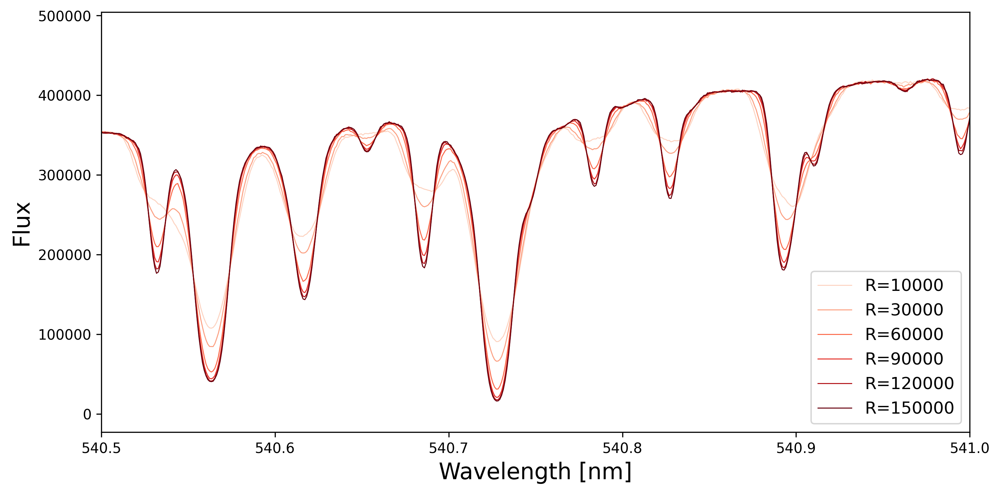

In [47]:
# plot the spectrum
# plot the spectrum of the first order
snr = 800
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")

plt.figure(figsize=(10, 5), dpi=300)
for i, iR in enumerate(R_values):
    filename = f"{iR}_{ispec}_{band}.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    color_red = plt.cm.Reds((i+1)/len(R_values))

    wave_lim = [540.5, 541]
    ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
    pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
    pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]
    plt.plot(data['wavelength'][-1, 0, :], data['flux'][-1, 0, :], linewidth=0.7, color=color_red, label=f"R={iR}")

plt.legend(fontsize=12)
plt.xlim(540.5, 541)
plt.xlabel('Wavelength [nm]', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.tight_layout()

## 2. Only cal-sci contamination.

[-34.38276921 -17.70599351 -35.38931695 -12.52403755  -7.89301826
  28.09451595 -38.58923467  70.7333228   22.3033925   19.30697729
 -81.71103315 -25.76484707  -7.23850907 -32.45474457 -11.82174819
   8.12408458  25.76484707  16.71312434 -18.22433244  -4.43217134
 -24.32007513  12.89067589 -15.32722946  -2.03362408  25.0320398
  17.70599351  -0.39263134]


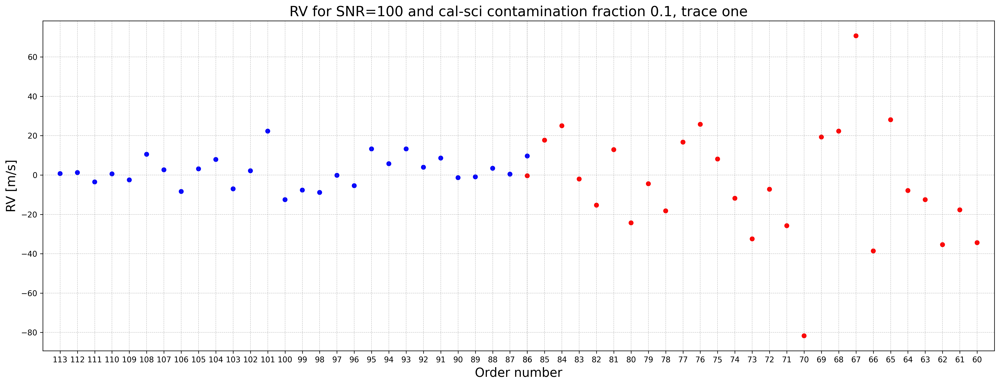

In [18]:
SNR_values = [100, 800]
calsci_frac_values = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]
nspec = 1

# load and plot SNR=100
snr = 100
calsci_frac = 1e-1
plt.figure(figsize=(18, 7), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
    filename = f"{calsci_frac}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    plt.scatter(order_num['red'], rv[:, 0], s=40, edgecolors='none', c='r')
    print(rv[:, 0])
    # plt.scatter(order_num['red'], rv[:, 1], s=20, edgecolors='none', c='r', alpha=0.1)
    # plt.scatter(order_num['red'], rv[:, 2], s=20, edgecolors='none', c='r', alpha=0.1)
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
    filename = f"{calsci_frac}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    plt.scatter(order_num['blue'], rv[:, 0], s=40, edgecolors='none', c='b')
    # plt.scatter(order_num['blue'], rv[:, 1], s=20, edgecolors='none', c='b', alpha=0.1)
    # plt.scatter(order_num['blue'], rv[:, 2], s=20, edgecolors='none', c='b', alpha=0.1)


# plt.yscale('log')
# plt.ylim(-5, 5)
plt.xlim(59, 114)
plt.gca().invert_xaxis()
plt.xticks(order, fontsize=10);  # Suppress output
plt.xlabel('Order number', fontsize=16);
plt.ylabel('RV [m/s]', fontsize=16);
plt.title(f"RV for SNR={snr} and cal-sci contamination fraction {calsci_frac}, trace one", fontsize=18);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.tight_layout()


In [19]:
ispec = 0

# extract RV precision information for contaminated trace 1
def rv_precision_calsci(calsci_frac_values):

    pre_red = np.zeros_like(calsci_frac_values, dtype=float)
    pre_blue = np.zeros_like(calsci_frac_values, dtype=float)

    rv_trace1_red = np.zeros((len(calsci_frac_values), len(order_num_red)))
    rv_trace1_blue = np.zeros((len(calsci_frac_values), len(order_num_blue)))

    for i, calsci_frac in enumerate(calsci_frac_values):
        # red
        output_folder_red = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename_red = f"{calsci_frac}_{ispec}_red.npz"
        filepath_red = os.path.join(output_folder_red, filename_red)
        data_red = np.load(filepath_red)
        rv_red = data_red['RV']
        rv_trace1_red[i, :] = rv_red[:, 0]
        # blue
        output_folder_blue = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename_blue = f"{calsci_frac}_{ispec}_blue.npz"
        filepath_blue = os.path.join(output_folder_blue, filename_blue)
        data_blue = np.load(filepath_blue)
        rv_blue = data_blue['RV']
        rv_trace1_blue[i, :] = rv_blue[:, 0]

    # red
    rv_median_red = np.median(rv_trace1_red, axis=1)
    rv_std_red = np.std(rv_trace1_red, axis=1)
    # blue
    rv_median_blue = np.median(rv_trace1_blue, axis=1)
    rv_std_blue = np.std(rv_trace1_blue, axis=1)

    return rv_median_red, rv_std_red, rv_median_blue, rv_std_blue

rv_median_red, rv_std_red, rv_median_blue, rv_std_blue = rv_precision_calsci(calsci_frac_values)
print(rv_median_red,rv_median_blue)

[-1.00000000e-03 -8.96150502e-03 -9.01337039e-02 -8.80769273e-01
 -7.23850907e+00] [0.         0.00167782 0.01667305 0.16193446 0.98244138]


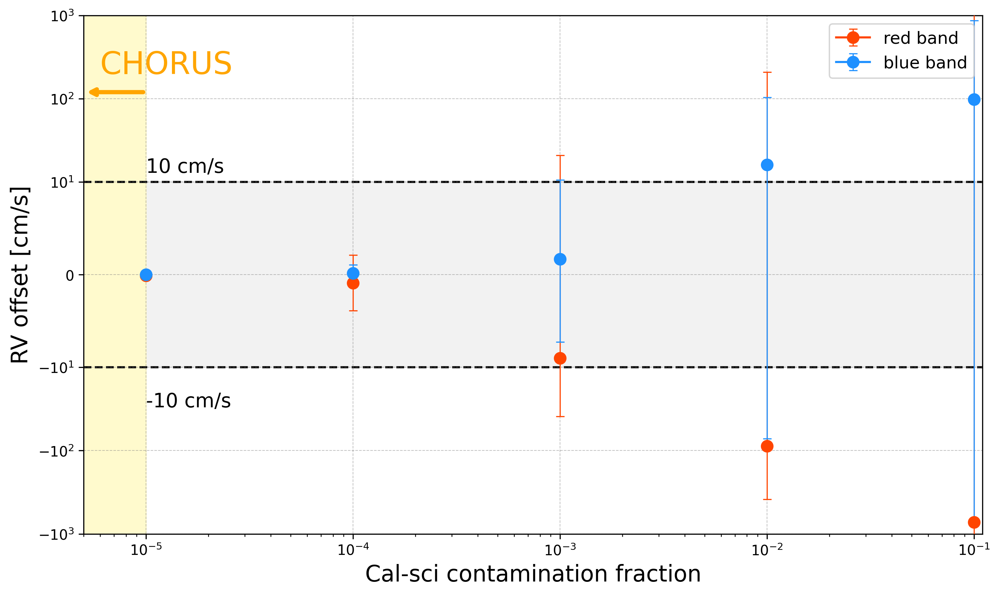

In [32]:
plt.figure(figsize=(10, 6), dpi=300)

# turn m/s to cm/s
for i in range(len(calsci_frac_values)):
    # trace 1
    red = plt.errorbar(calsci_frac_values[i], rv_median_red[i]*100, yerr=rv_std_red[i]*100, marker='o',
        elinewidth=0.8, capsize=3, capthick=0.8, color='orangered', ms=8, zorder=5)
    blue = plt.errorbar(calsci_frac_values[i], rv_median_blue[i]*100, yerr=rv_std_blue[i]*100, marker='o',
        elinewidth=0.8, capsize=3, capthick=0.8, color='dodgerblue', ms=8, zorder=5)
    # dangerous points
    # if abs(rv_median_red[i]) > 0.1:
    #     dangerous = plt.scatter(calsci_frac_values[i], rv_median_red[i]*100, color='k', marker='x', linewidth=2, s=80, zorder=10)
    # if abs(rv_median_blue[i]) > 0.1:
    #     plt.scatter(calsci_frac_values[i], rv_median_blue[i]*100, color='k', marker='x', linewidth=2, s=80, zorder=10)

# CHORUS setting
plt.axvspan(1e-6, 1e-5, color='lemonchiffon', zorder=1)
plt.text(0.6e-5, 200, 'CHORUS', fontsize=22, color='orange', zorder=10)
# add an left arrow to indicate CHORUS setting is much smaller than 1e-6
plt.annotate('', xy=(1e-5, 120), xytext=(0.5e-5, 120), arrowprops=dict(arrowstyle='<-', color='orange', linewidth=3), zorder=10)

# mark 10cm/s
plt.axhline(y=10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.axhline(y=-10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(10**-5, 13, '10 cm/s', fontsize=14, color='k', zorder=10)
plt.text(10**-5, -30, '-10 cm/s', fontsize=14, color='k', zorder=10)
plt.axhspan(-10, 10, color='gray', alpha=0.1, zorder=0)
# plt.text(0.15e-1, 0.2, 'tolerable', fontsize=22, color='black', zorder=10)

plt.xscale('log')
plt.yscale('symlog', linthresh=10)  # Increase linthresh to expand spacing near zero
plt.xlim(0.5e-5, 1.1e-1);
plt.ylim(-1000, 1000);  # Optionally adjust limits for better visualization
plt.xlabel('Cal-sci contamination fraction', fontsize=16)
plt.ylabel('RV offset [cm/s]', fontsize=16)
# plt.title(f"RV bias for different cal-sci contamination fraction, trace one", fontsize=18)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.legend([red, blue], ['red band', 'blue band'], fontsize=12)
plt.tight_layout()

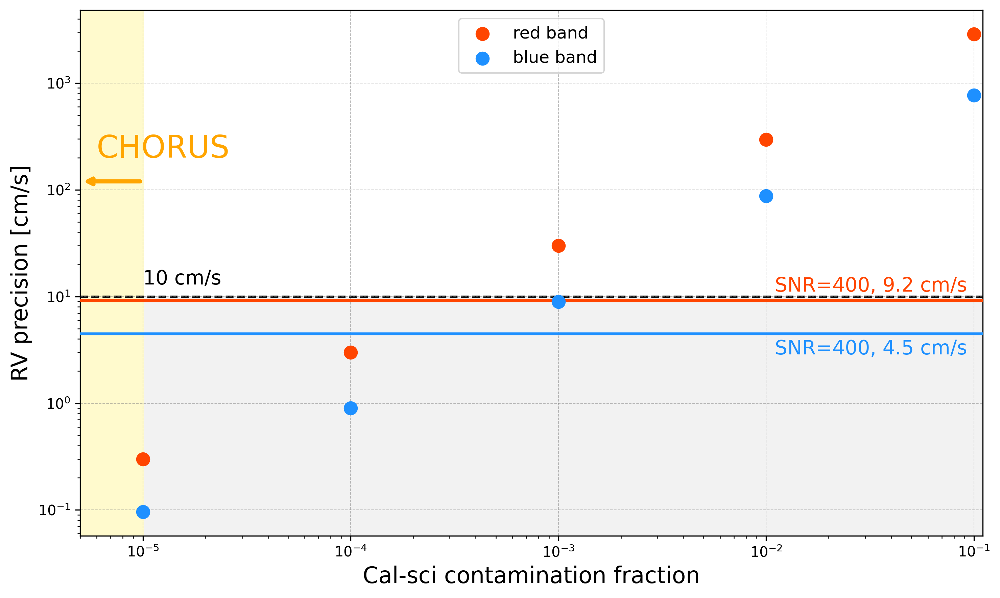

In [33]:
calsci_frac_values = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]

plt.figure(figsize=(10, 6), dpi=300)

# turn m/s to cm/s
for i in range(len(calsci_frac_values)):
    # trace 1
    red = plt.scatter(calsci_frac_values[i], rv_std_red[i]*100, marker='o', color='orangered', s=80, zorder=5)
    blue = plt.scatter(calsci_frac_values[i], rv_std_blue[i]*100, marker='o', color='dodgerblue', s=80, zorder=5)
    # # dangerous points
    # if (rv_std_red[i] >= 0.1):
    #     dangerous = plt.scatter(calsci_frac_values[i], rv_std_red[i]*100, color='k', marker='x', linewidth=2, s=100, zorder=10)
    # if (rv_std_blue[i] >= 0.1):
    #     plt.scatter(calsci_frac_values[i], rv_std_blue[i]*100, color='k', marker='x', linewidth=2, s=100, zorder=10)

# CHORUS setting
plt.axvspan(1e-6, 1e-5, color='lemonchiffon', zorder=1)
plt.text(0.6e-5, 200, 'CHORUS', fontsize=22, color='orange', zorder=10)
# add an left arrow to indicate CHORUS setting is much smaller than 1e-6
plt.annotate('', xy=(1e-5, 120), xytext=(0.5e-5, 120), arrowprops=dict(arrowstyle='<-', color='orange', linewidth=3), zorder=10)

# mark 10cm/s
plt.axhline(y=10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(10**-5, 13, '10 cm/s', fontsize=14, color='k', zorder=10)
plt.axhspan(0, 10, color='gray', alpha=0.1, zorder=0)
# plt.text(0.15e-1, 0.2, 'tolerable', fontsize=22, color='black', zorder=10)

# mark precision at SNR=400
plt.axhline(pre_red_12[3]*100, color='orangered', linewidth=2, zorder=4)
plt.axhline(pre_blue_12[3]*100, color='dodgerblue', linewidth=2, zorder=4)
plt.text(0.11e-1, pre_red_12[3]*100+2, f'SNR=400, {pre_red_12[3]*100:.1f} cm/s', fontsize=14, color='orangered', zorder=10)
plt.text(0.11e-1, pre_blue_12[3]*100-1.6, f'SNR=400, {pre_blue_12[3]*100:.1f} cm/s', fontsize=14, color='dodgerblue', zorder=10)

plt.xscale('log')
plt.yscale('log')  # Increase linthresh to expand spacing near zero
plt.xlim(0.5e-5, 1.1e-1);
# plt.ylim(-1000, 1000);  # Optionally adjust limits for better visualization
plt.xlabel('Cal-sci contamination fraction', fontsize=16)
plt.ylabel('RV precision [cm/s]', fontsize=16)
# plt.title(f"RV precision for different cal-sci contamination fraction, trace one", fontsize=18)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.legend([red, blue], ['red band', 'blue band'], fontsize=12)
plt.tight_layout()

In [171]:
# plot Doppler information v.s. RV bias??
# define Doppler information base on the number of lines, credit Sharon X. Wang
import scipy.constants as cs
import pdb
stop = pdb.set_trace

def get_rv_content(wave, flux):
    # returns the photon-limited RV precision based on Butler et al. 1996 formula assuming SNR = 1000
    # Written by Bryson Cale, copied over from plot_err_abs.py
    flux[np.where(flux < 0)[0]] = 1E-8
    snr = 1000
    counts = snr**2
    gain = 1.0
    pe = gain * counts
    A_center = pe
    s = 0
    A = A_center * flux  # convert normalized flux to photoelectrons
    for i in range(len(wave)-1):
        Ai = A[i]
        if Ai > 0:  # ignore this pixel if flux drops to zero, SXW Aug 2019
            dAi_dlami = (A[i+1] - A[i]) / (wave[i+1] - wave[i])
            lami = wave[i]
            s += (lami * dAi_dlami)**2 / Ai
        if s < 0:
            print(Ai, s)
            stop()
    return cs.c / np.sqrt(s)

In [178]:
ispec = 0
snr = 100

# get normalized spectra of each order for contaminated trace 1
def get_spec(calsci_frac_values):

    spec_red = np.zeros((len(calsci_frac_values), len(order_num_red), 8000))
    spec_blue = np.zeros((len(calsci_frac_values), len(order_num_blue), 8000))

    for i, calsci_frac in enumerate(calsci_frac_values):
        # red
        output_folder_red = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename_red = f"{calsci_frac}_{ispec}_red.npz"
        filepath_red = os.path.join(output_folder_red, filename_red)
        data_red = np.load(filepath_red)
        wave_red = data_red['wavelength'][:, 0, :]
        flux_red = data_red['flux']
        blaze_red = data_red['blaze']
        throughput_red = data_red['throughput']
        normalized_red = flux_red / (blaze_red * throughput_red * snr**2)
        normalized1_red = normalized_red[:, 0]
        spec_red[i, :, :] = normalized1_red
        # blue
        output_folder_blue = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename_blue = f"{calsci_frac}_{ispec}_blue.npz"
        filepath_blue = os.path.join(output_folder_blue, filename_blue)
        data_blue = np.load(filepath_blue)
        wave_blue = data_blue['wavelength'][:, 0, :]
        flux_blue = data_blue['flux']
        blaze_blue = data_blue['blaze']
        throughput_blue = data_blue['throughput']
        normalized_blue = flux_blue / (blaze_blue * throughput_blue * snr**2)
        normalized1_blue = normalized_blue[:, 0]
        spec_blue[i, :, :] = normalized1_blue

    return wave_red, spec_red, wave_blue, spec_blue

wave_red, spec_red, wave_blue, spec_blue = get_spec(calsci_frac_values)
wave_red.shape, spec_red.shape

((27, 8000), (5, 27, 8000))

In [164]:
# load the template file
template_folder = os.path.join(pwd, "input/sun.npz")
template_data = np.load(template_folder)
wave_temp = template_data['arr_0']
temp_flux = template_data['arr_1']

# theoretical FP lines
def FP(wavelength):
    normalized_FP = 1 / (1 + 18 * np.sin((2*np.pi*7.8e6) / wavelength)**2)
    return normalized_FP

In [185]:
# get Doppler information of FP lines and temp in this wavelength range
def get_doppler_info(wave, temp_wave, temp_flux):

    doppler_FP = np.zeros(len(wave))
    doppler_temp = np.zeros(len(wave))

    # loop over all orders
    for i in range(len(wave)):
        # information of this trace
        this_wave = wave[i, :]
        # select the wavelength range of this order
        ind = np.where((temp_wave >= min(this_wave)) & (temp_wave <= max(this_wave)))[0]
        this_temp_flux = temp_flux[ind]
        # get theoretical FP lines
        this_FP_flux = FP(this_wave)
        # get Doppler information
        doppler_FP[i] = get_rv_content(this_wave, this_FP_flux)
        doppler_temp[i] = get_rv_content(this_wave, this_temp_flux)

    ratio = doppler_temp / doppler_FP

    return doppler_FP, doppler_temp, ratio

doppler_FP_red, doppler_temp_red, ratio_red = get_doppler_info(wave_red, wave_temp, temp_flux)
doppler_FP_blue, doppler_temp_blue, ratio_blue = get_doppler_info(wave_blue, wave_temp, temp_flux)

In [243]:
np.argsort(ratio_red)

array([15, 14, 23, 21, 24, 26, 25, 13, 12, 17, 20, 19,  1, 22, 10,  4, 18,
        2, 16,  0,  6, 11,  3,  9,  8,  5,  7])

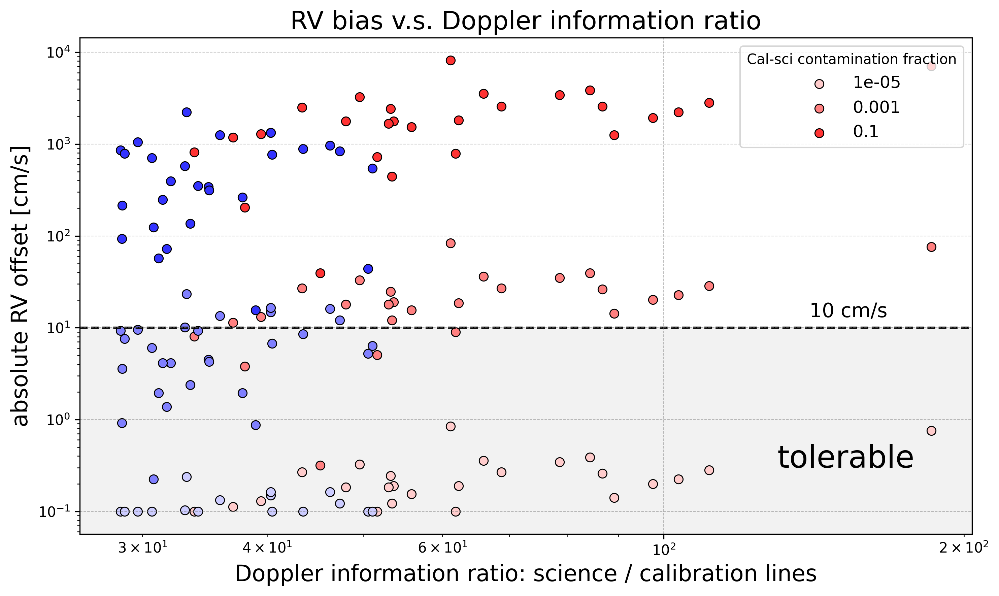

In [401]:
calsci_frac_values = [1e-5, 1e-3, 1e-1]

# plot RV bias v.s. Doppler information
plt.figure(figsize=(10, 6), dpi=300)
# red band
for ispec in range(nspec):
    for i, calsci_frac in enumerate(calsci_frac_values):
        output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename = f"{calsci_frac}_{ispec}_red.npz"
        filepath = os.path.join(output_folder, filename)
        data = np.load(filepath)
        rv = data['RV']
        # plot the scattered points with color representing the cal-sci contamination fraction, the darker red, the larger fraction
        plt.scatter(ratio_red, abs(rv[:, 0]*100), s=40, color=(1, 0.8-i*0.3, 0.8-i*0.3), edgecolors='k', linewidth=0.7, label=f"{calsci_frac}")
        ind_red = np.argsort(ratio_red)
        # plt.plot(ratio_red[ind_red], abs(rv[:, 0]*100)[ind_red], color=(1, 0.8-i*0.3, 0.8-i*0.3), linewidth=1.5)
# blue band
for ispec in range(nspec):
    for i, calsci_frac in enumerate(calsci_frac_values):
        output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename = f"{calsci_frac}_{ispec}_blue.npz"
        filepath = os.path.join(output_folder, filename)
        data = np.load(filepath)
        rv = data['RV']
        plt.scatter(ratio_blue, abs(rv[:, 0]*100), s=40, color=(0.8-i*0.3, 0.8-i*0.3, 1), edgecolors='k', linewidth=0.7)
        ind_blue = np.argsort(ratio_blue)
        # plt.plot(ratio_blue[ind_blue], abs(rv[:, 0]*100)[ind_blue], color=(0.8-i*0.3, 0.8-i*0.3, 1), linewidth=1.5)

# 10 cm/s
plt.axhline(y=10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(140, 13, '10 cm/s', fontsize=14, color='k', zorder=10)
plt.axhspan(0, 10, color='gray', alpha=0.1, zorder=0)
plt.text(130, 0.3, 'tolerable', fontsize=22, color='black', zorder=10)

plt.xscale('log')
plt.yscale('log')  # Increase linthresh to expand spacing near zero
plt.xlabel('Doppler information ratio: science / calibration lines', fontsize=16)
plt.ylabel('absolute RV offset [cm/s]', fontsize=16)
plt.title(f"RV bias v.s. Doppler information ratio", fontsize=18)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.legend(fontsize=12, title='Cal-sci contamination fraction', loc='upper right', handletextpad=1)
plt.tight_layout()

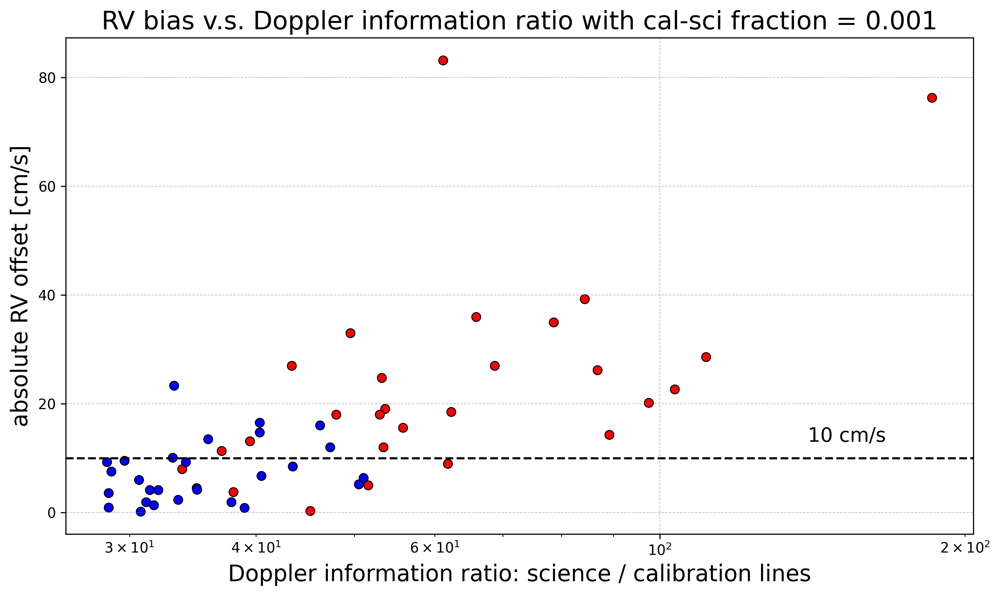

In [267]:
calsci_frac_values = [1e-3]

# plot RV bias v.s. Doppler information
plt.figure(figsize=(10, 6), dpi=300)
# red band
for ispec in range(nspec):
    for i, calsci_frac in enumerate(calsci_frac_values):
        output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename = f"{calsci_frac}_{ispec}_red.npz"
        filepath = os.path.join(output_folder, filename)
        data = np.load(filepath)
        rv = data['RV']
        # plot the scattered points with color representing the cal-sci contamination fraction, the darker red, the larger fraction
        plt.scatter(ratio_red, abs(rv[:, 0]*100), s=40, color='red', edgecolors='k', linewidth=0.7, label=f"{calsci_frac}")
        ind_red = np.argsort(ratio_red)
        # plt.plot(ratio_red[ind_red], abs(rv[:, 0]*100)[ind_red], color=(1, 0.8-i*0.15, 0.8-i*0.15), linewidth=1.5)
# blue band
for ispec in range(nspec):
    for i, calsci_frac in enumerate(calsci_frac_values):
        output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename = f"{calsci_frac}_{ispec}_blue.npz"
        filepath = os.path.join(output_folder, filename)
        data = np.load(filepath)
        rv = data['RV']
        plt.scatter(ratio_blue, abs(rv[:, 0]*100), s=40, color='blue', edgecolors='k', linewidth=0.7)
        ind_blue = np.argsort(ratio_blue)
        # plt.plot(ratio_blue[ind_blue], abs(rv[:, 0]*100)[ind_blue], color=(0.8-i*0.15, 0.8-i*0.15, 1), linewidth=1.5)

# 10 cm/s
plt.axhline(y=10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(140, 13, '10 cm/s', fontsize=14, color='k', zorder=10)

plt.xscale('log')
# plt.yscale('log')  # Increase linthresh to expand spacing near zero
plt.xlabel('Doppler information ratio: science / calibration lines', fontsize=16)
plt.ylabel('absolute RV offset [cm/s]', fontsize=16)
plt.title(f"RV bias v.s. Doppler information ratio with cal-sci fraction = {calsci_frac}", fontsize=18)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
# plt.legend(fontsize=12, title='Cal-sci contamination fraction', loc='upper right', handletextpad=1)
plt.tight_layout()

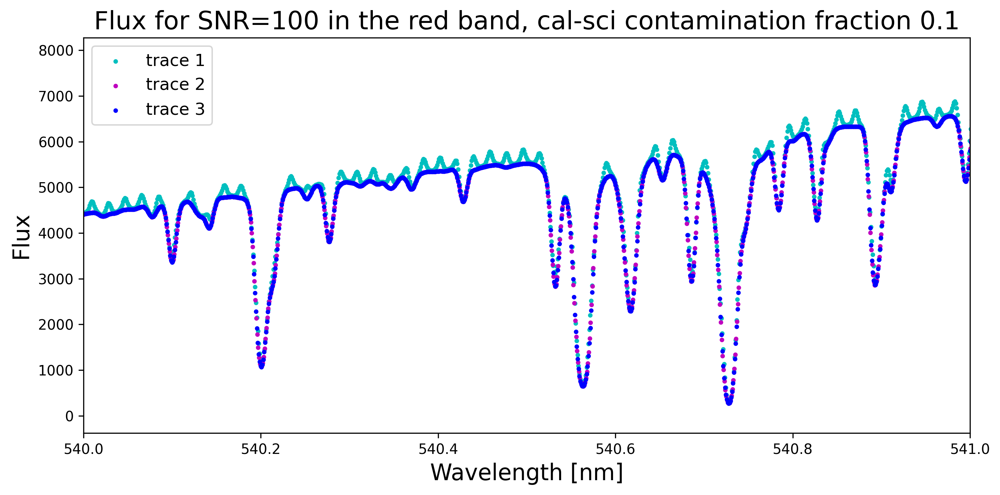

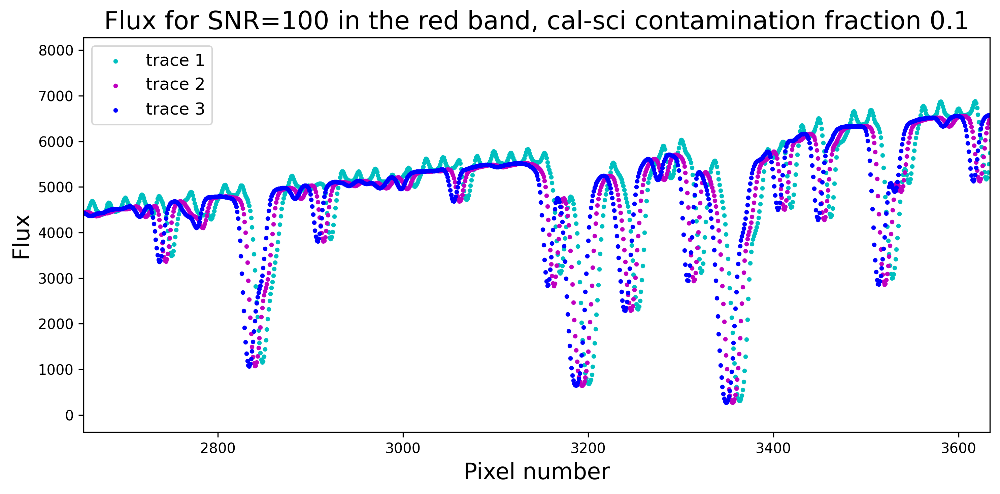

In [12]:
# plot the spectrum of the first order
snr = 100
calsci_frac = 1e-1
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
filename = f"{calsci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [540, 541]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

plt.figure(figsize=(10, 5), dpi=300)
plt.scatter(data['wavelength'][-1, 0, :], data['flux'][-1, 0, :], s=5, color='c', label='trace 1')
plt.scatter(data['wavelength'][-1, 1, :], data['flux'][-1, 1, :], s=5, color='m', label='trace 2')
plt.scatter(data['wavelength'][-1, 2, :], data['flux'][-1, 2, :], s=5, color='b', label='trace 3')
plt.legend(fontsize=12)
plt.xlim(540, 541)
plt.xlabel('Wavelength [nm]', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title(f"Flux for SNR={snr} in the {band} band, cal-sci contamination fraction {calsci_frac}", fontsize=18)
plt.tight_layout()

plt.figure(figsize=(10, 5), dpi=300)
plt.scatter(range(1, 8001), data['flux'][-1, 0, :], s=5, color='c', label ='trace 1')
plt.scatter(range(1, 8001), data['flux'][-1, 1, :], s=5, color='m', label='trace 2')
plt.scatter(range(1, 8001), data['flux'][-1, 2, :], s=5, color='b', label='trace 3')
plt.legend(fontsize=12)
plt.xlim(pix_ind[0], pix_ind[1])
plt.xlabel('Pixel number', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title(f"Flux for SNR={snr} in the {band} band, cal-sci contamination fraction {calsci_frac}", fontsize=18)
plt.tight_layout()

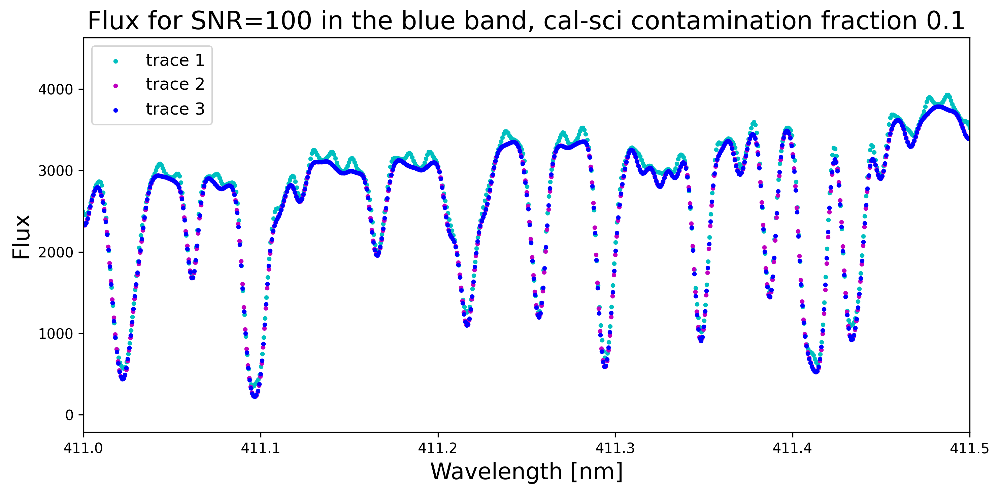

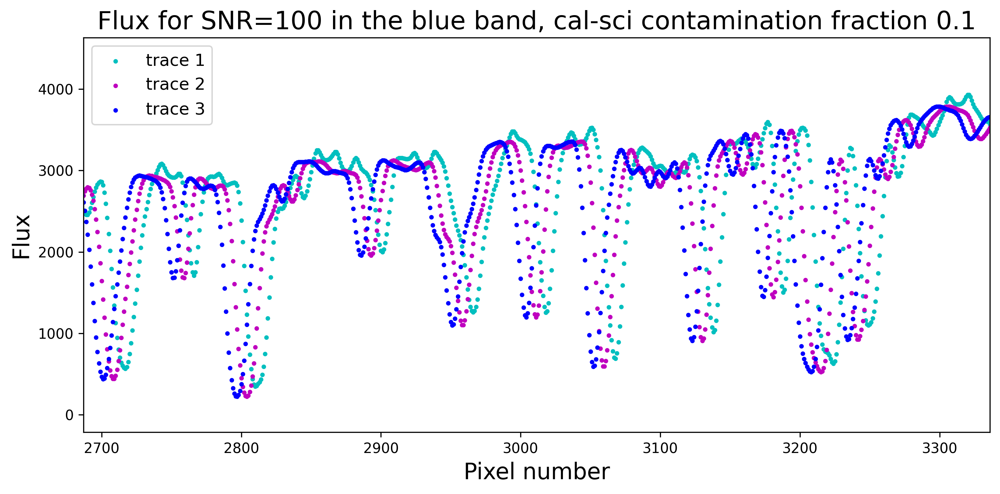

In [13]:
# plot the spectrum of the first order
snr = 100
calsci_frac = 1e-1
band = 'blue'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
filename = f"{calsci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [411, 411.5]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

plt.figure(figsize=(10, 5), dpi=300)
plt.scatter(data['wavelength'][-1, 0, :], data['flux'][-1, 0, :], s=5, color='c', label='trace 1')
plt.scatter(data['wavelength'][-1, 1, :], data['flux'][-1, 1, :], s=5, color='m', label='trace 2')
plt.scatter(data['wavelength'][-1, 2, :], data['flux'][-1, 2, :], s=5, color='b', label='trace 3')
plt.legend(fontsize=12)
plt.xlim(411, 411.5)
plt.xlabel('Wavelength [nm]', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title(f"Flux for SNR={snr} in the {band} band, cal-sci contamination fraction {calsci_frac}", fontsize=18)
plt.tight_layout()

plt.figure(figsize=(10, 5), dpi=300)
plt.scatter(range(1, 8001), data['flux'][-1, 0, :], s=5, color='c', label ='trace 1')
plt.scatter(range(1, 8001), data['flux'][-1, 1, :], s=5, color='m', label='trace 2')
plt.scatter(range(1, 8001), data['flux'][-1, 2, :], s=5, color='b', label='trace 3')
plt.legend(fontsize=12)
plt.xlim(pix_ind[0], pix_ind[1])
plt.xlabel('Pixel number', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title(f"Flux for SNR={snr} in the {band} band, cal-sci contamination fraction {calsci_frac}", fontsize=18)
plt.tight_layout()

## 3. Only sci-sci contamination.

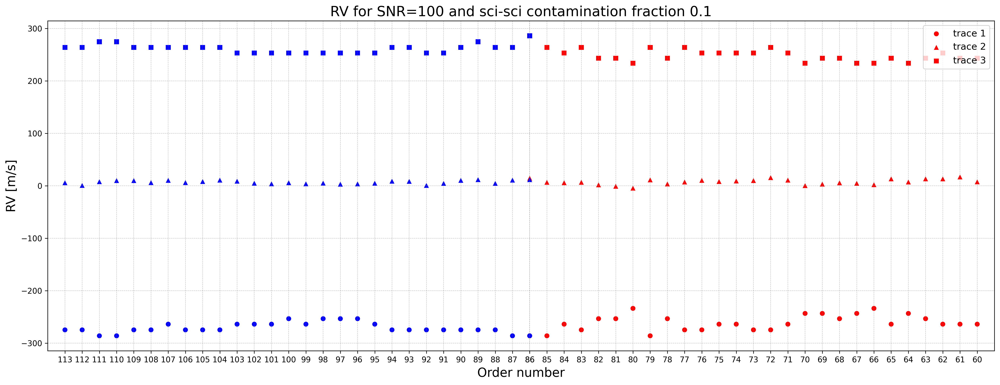

In [403]:
SNR_values = [100, 800]
scisci_frac_values = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]
nspec = 1

# load and plot SNR=100
snr = 100
scisci_frac = 1e-1
plt.figure(figsize=(18, 7), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
    filename = f"{scisci_frac}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    plt.scatter(order_num['red'], rv[:, 0], s=40, edgecolors='none', c='r', marker='o', label='trace 1')
    plt.scatter(order_num['red'], rv[:, 1], s=40, edgecolors='none', c='r', marker='^', label='trace 2')
    plt.scatter(order_num['red'], rv[:, 2], s=40, edgecolors='none', c='r', marker='s', label='trace 3')
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
    filename = f"{scisci_frac}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    plt.scatter(order_num['blue'], rv[:, 0], s=40, edgecolors='none', c='b', marker='o')
    plt.scatter(order_num['blue'], rv[:, 1], s=40, edgecolors='none', c='b', marker='^')
    plt.scatter(order_num['blue'], rv[:, 2], s=40, edgecolors='none', c='b', marker='s')

# plt.yscale('log')
# plt.ylim(-5, 5)
plt.xlim(59, 114)
plt.gca().invert_xaxis()
plt.xticks(order, fontsize=10);  # Suppress output
plt.xlabel('Order number', fontsize=16);
plt.ylabel('RV [m/s]', fontsize=16);
plt.title(f"RV for SNR={snr} and sci-sci contamination fraction {scisci_frac}", fontsize=18);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.legend(fontsize=12)
plt.tight_layout()

In [404]:
ispec = 0

# extract RV precision information for contaminated trace 1
def rv_precision_calsci(scisci_frac_values):

    pre_red = np.zeros_like(scisci_frac_values, dtype=float)
    pre_blue = np.zeros_like(scisci_frac_values, dtype=float)

    rv_trace1_red = np.zeros((len(scisci_frac_values), len(order_num_red)))
    rv_trace1_blue = np.zeros((len(scisci_frac_values), len(order_num_blue)))
    rv_trace2_red = np.zeros((len(scisci_frac_values), len(order_num_red)))
    rv_trace2_blue = np.zeros((len(scisci_frac_values), len(order_num_blue)))
    rv_trace3_red = np.zeros((len(scisci_frac_values), len(order_num_red)))
    rv_trace3_blue = np.zeros((len(scisci_frac_values), len(order_num_blue)))

    for i, scisci_frac in enumerate(scisci_frac_values):
        # red
        output_folder_red = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
        filename_red = f"{scisci_frac}_{ispec}_red.npz"
        filepath_red = os.path.join(output_folder_red, filename_red)
        data_red = np.load(filepath_red)
        rv_red = data_red['RV']
        rv_trace1_red[i, :] = rv_red[:, 0]
        rv_trace2_red[i, :] = rv_red[:, 1]
        rv_trace3_red[i, :] = rv_red[:, 2]
        # blue
        output_folder_blue = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
        filename_blue = f"{scisci_frac}_{ispec}_blue.npz"
        filepath_blue = os.path.join(output_folder_blue, filename_blue)
        data_blue = np.load(filepath_blue)
        rv_blue = data_blue['RV']
        rv_trace1_blue[i, :] = rv_blue[:, 0]
        rv_trace2_blue[i, :] = rv_blue[:, 1]
        rv_trace3_blue[i, :] = rv_blue[:, 2]

    # red
    rv_median1_red = np.median(rv_trace1_red, axis=1)
    rv_std1_red = np.std(rv_trace1_red, axis=1)
    rv_median2_red = np.median(rv_trace2_red, axis=1)
    rv_std2_red = np.std(rv_trace2_red, axis=1)
    rv_median3_red = np.median(rv_trace3_red, axis=1)
    rv_std3_red = np.std(rv_trace3_red, axis=1)
    # blue
    rv_median1_blue = np.median(rv_trace1_blue, axis=1)
    rv_std1_blue = np.std(rv_trace1_blue, axis=1)
    rv_median2_blue = np.median(rv_trace2_blue, axis=1)
    rv_std2_blue = np.std(rv_trace2_blue, axis=1)
    rv_median3_blue = np.median(rv_trace3_blue, axis=1)
    rv_std3_blue = np.std(rv_trace3_blue, axis=1)

    return rv_median1_red, rv_std1_red, rv_median1_blue, rv_std1_blue, rv_median2_red, rv_std2_red, rv_median2_blue, rv_std2_blue, rv_median3_red, rv_std3_red, rv_median3_blue, rv_std3_blue

rv_median1_red, rv_std1_red, rv_median1_blue, rv_std1_blue, rv_median2_red, rv_std2_red, rv_median2_blue, rv_std2_blue, rv_median3_red, rv_std3_red, rv_median3_blue, rv_std3_blue = rv_precision_calsci(scisci_frac_values)

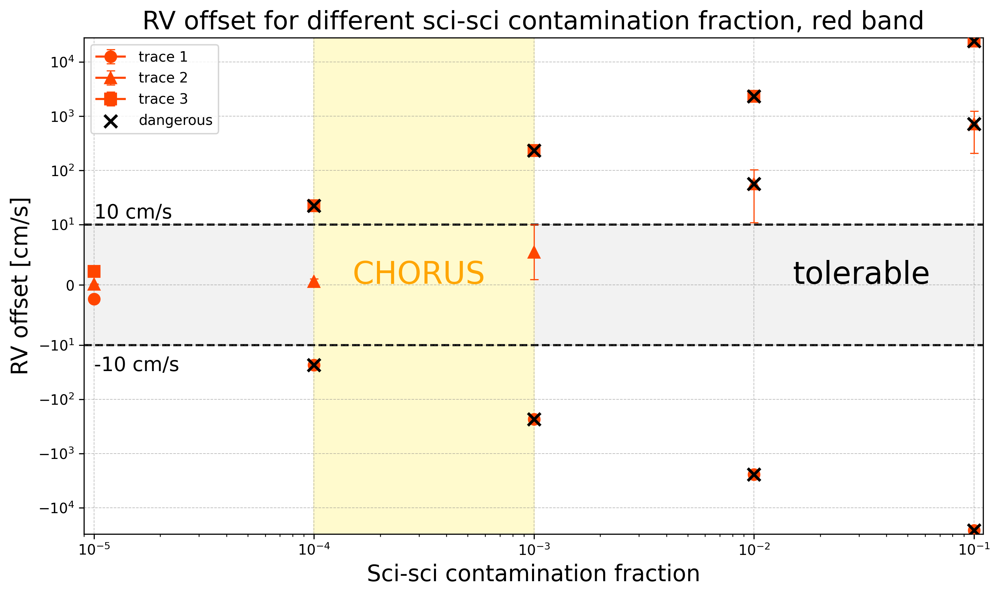

In [409]:
plt.figure(figsize=(10, 6), dpi=300)
# turn m/s to cm/s
for i in range(len(scisci_frac_values)):
    # trace 1
    trace1 = plt.errorbar(scisci_frac_values[i], rv_median1_red[i]*100, yerr=rv_std1_red[i]*100, marker='o',
            elinewidth=0.8, capsize=3, capthick=0.8, color='orangered', ms=8, zorder=5)
    # trace 2
    trace2 = plt.errorbar(scisci_frac_values[i], rv_median2_red[i]*100, yerr=rv_std2_red[i]*100, marker='^',
            elinewidth=0.8, capsize=3, capthick=0.8, color='orangered', ms=8, zorder=5)
    # trace 3
    trace3 = plt.errorbar(scisci_frac_values[i], rv_median3_red[i]*100, yerr=rv_std3_red[i]*100, marker='s',
            elinewidth=0.8, capsize=3, capthick=0.8, color='orangered', ms=8, zorder=5)

    # plot the dangerous points
    if abs(rv_median1_red[i]) >= 0.1:
        dangerous = plt.scatter(scisci_frac_values[i], rv_median1_red[i]*100, color='k', marker='x', linewidths=2, s=80, zorder=10)
    if abs(rv_median2_red[i]) >= 0.1:
        plt.scatter(scisci_frac_values[i], rv_median2_red[i]*100, color='k', marker='x', linewidths=2, s=80, zorder=10)
    if abs(rv_median3_red[i]) >= 0.1:
        plt.scatter(scisci_frac_values[i], rv_median3_red[i]*100, color='k', marker='x', linewidths=2, s=80, zorder=10)

# CHORUS setting
plt.axvspan(1e-4, 1e-3, color='lemonchiffon', zorder=1)
plt.text(1.5e-4, 0.2, 'CHORUS', fontsize=22, color='orange', zorder=10)

# mark 10cm/s
plt.axhline(y=10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.axhline(y=-10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(10**-5, 13, '10 cm/s', fontsize=14, color='k', zorder=10)
plt.text(10**-5, -30, '-10 cm/s', fontsize=14, color='k', zorder=10)
plt.axhspan(-10, 10, color='gray', alpha=0.1, zorder=0)
plt.text(0.15e-1, 0.2, 'tolerable', fontsize=22, color='black', zorder=10)

plt.xscale('log')
plt.yscale('symlog', linthresh=10)  # Increase linthresh to expand spacing near zero
plt.xlim(0.9e-5, 1.1e-1);
# plt.ylim(-1000, 1000);  # Optionally adjust limits for better visualization
plt.xlabel('Sci-sci contamination fraction', fontsize=16)
plt.ylabel('RV offset [cm/s]', fontsize=16)
plt.title(f"RV offset for different sci-sci contamination fraction, red band", fontsize=18)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.legend([trace1, trace2, trace3, dangerous], ['trace 1', 'trace 2', 'trace 3', 'dangerous'], loc='upper left', handletextpad=1, fontsize=10)
plt.tight_layout()

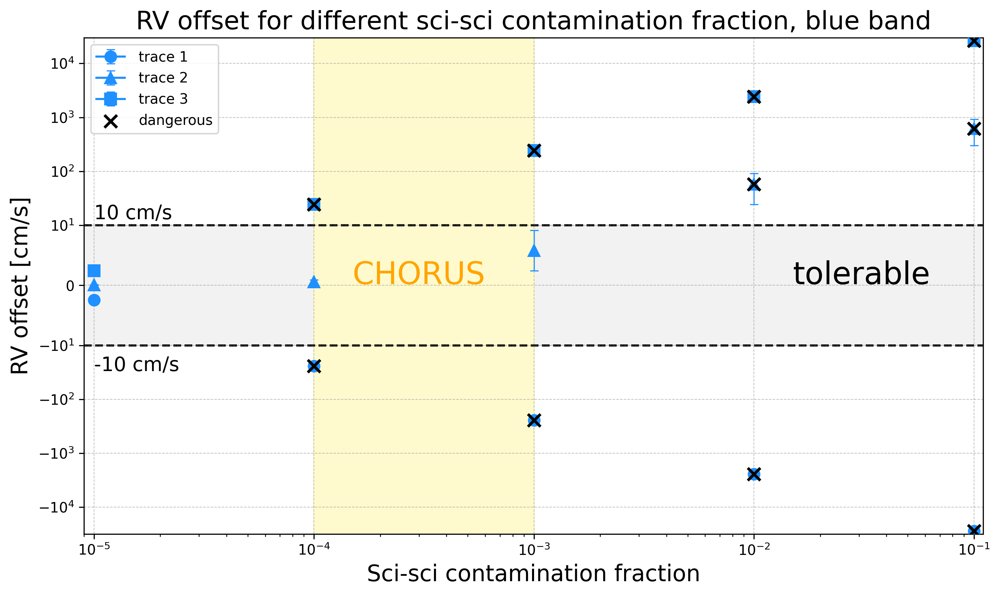

In [410]:
plt.figure(figsize=(10, 6), dpi=300)
# turn m/s to cm/s
for i in range(len(scisci_frac_values)):
    # trace 1
    trace1 = plt.errorbar(scisci_frac_values[i], rv_median1_blue[i]*100, yerr=rv_std1_blue[i]*100, marker='o',
            elinewidth=0.8, capsize=3, capthick=0.8, color='dodgerblue', ms=8, zorder=5)
    # trace 2
    trace2 = plt.errorbar(scisci_frac_values[i], rv_median2_blue[i]*100, yerr=rv_std2_blue[i]*100, marker='^',
            elinewidth=0.8, capsize=3, capthick=0.8, color='dodgerblue', ms=8, zorder=5)
    # trace 3
    trace3 = plt.errorbar(scisci_frac_values[i], rv_median3_blue[i]*100, yerr=rv_std3_blue[i]*100, marker='s',
            elinewidth=0.8, capsize=3, capthick=0.8, color='dodgerblue', ms=8, zorder=5)

    # plot the dangerous points
    if abs(rv_median1_blue[i]) >= 0.1:
        dangerous = plt.scatter(scisci_frac_values[i], rv_median1_blue[i]*100, color='k', marker='x', linewidths=2, s=80, zorder=10)
    if abs(rv_median2_blue[i]) >= 0.1:
        plt.scatter(scisci_frac_values[i], rv_median2_blue[i]*100, color='k', marker='x', linewidths=2, s=80, zorder=10)
    if abs(rv_median3_blue[i]) >= 0.1:
        plt.scatter(scisci_frac_values[i], rv_median3_blue[i]*100, color='k', marker='x', linewidths=2, s=80, zorder=10)

# CHORUS setting
plt.axvspan(1e-4, 1e-3, color='lemonchiffon', zorder=1)
plt.text(1.5e-4, 0.2, 'CHORUS', fontsize=22, color='orange', zorder=10)

# mark 10cm/s
plt.axhline(y=10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.axhline(y=-10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(10**-5, 13, '10 cm/s', fontsize=14, color='k', zorder=10)
plt.text(10**-5, -30, '-10 cm/s', fontsize=14, color='k', zorder=10)
plt.axhspan(-10, 10, color='gray', alpha=0.1, zorder=0)
plt.text(0.15e-1, 0.2, 'tolerable', fontsize=22, color='black', zorder=10)

plt.xscale('log')
plt.yscale('symlog', linthresh=10)  # Increase linthresh to expand spacing near zero
plt.xlim(0.9e-5, 1.1e-1);
# plt.ylim(-1000, 1000);  # Optionally adjust limits for better visualization
plt.xlabel('Sci-sci contamination fraction', fontsize=16)
plt.ylabel('RV offset [cm/s]', fontsize=16)
plt.title(f"RV offset for different sci-sci contamination fraction, blue band", fontsize=18)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.legend([trace1, trace2, trace3, dangerous], ['trace 1', 'trace 2', 'trace 3', 'dangerous'], loc='upper left', handletextpad=1, fontsize=10)
plt.tight_layout()

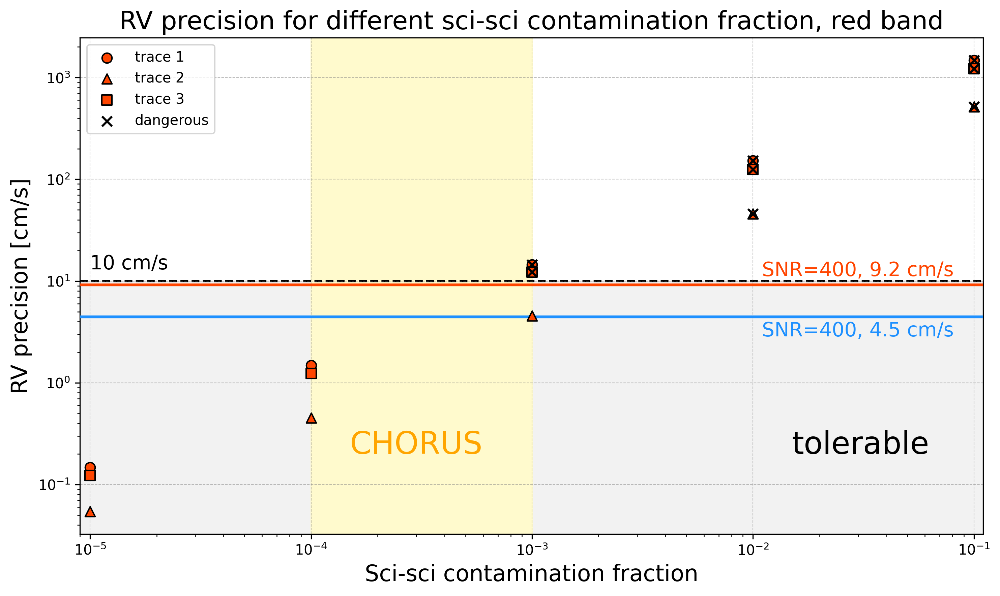

In [411]:
plt.figure(figsize=(10, 6), dpi=300)
# turn m/s to cm/s
for i in range(len(scisci_frac_values)):
    # trace 1
    trace1 = plt.scatter(scisci_frac_values[i], rv_std1_red[i]*100, marker='o', color='orangered', edgecolors='k', s=50, zorder=5)
    # trace 2
    trace2 = plt.scatter(scisci_frac_values[i], rv_std2_red[i]*100, marker='^', color='orangered', edgecolors='k', s=50, zorder=5)
    # trace 3
    trace3 = plt.scatter(scisci_frac_values[i], rv_std3_red[i]*100, marker='s', color='orangered', edgecolors='k', s=50, zorder=5)

    # plot the dangerous points
    if rv_std1_red[i] >= 0.1:
        dangerous = plt.scatter(scisci_frac_values[i], rv_std1_red[i]*100, color='k', marker='x', linewidths=1.5, s=50, zorder=10)
    if rv_std2_red[i] >= 0.1:
        plt.scatter(scisci_frac_values[i], rv_std2_red[i]*100, color='k', marker='x', linewidths=1.5, s=50, zorder=10)
    if rv_std3_red[i] >= 0.1:
        plt.scatter(scisci_frac_values[i], rv_std3_red[i]*100, color='k', marker='x', linewidths=1.5, s=50, zorder=10)

# CHORUS setting
plt.axvspan(1e-4, 1e-3, color='lemonchiffon', zorder=1)
plt.text(1.5e-4, 0.2, 'CHORUS', fontsize=22, color='orange', zorder=10)

# mark 10cm/s
plt.axhline(y=10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(10**-5, 13, '10 cm/s', fontsize=14, color='k', zorder=10)
plt.axhspan(0, 10, color='gray', alpha=0.1, zorder=0)
plt.text(0.15e-1, 0.2, 'tolerable', fontsize=22, color='black', zorder=10)

# mark precision at SNR=400
plt.axhline(pre_red_12[3]*100, color='orangered', linewidth=2, zorder=4)
plt.axhline(pre_blue_12[3]*100, color='dodgerblue', linewidth=2, zorder=4)
plt.text(0.11e-1, pre_red_12[3]*100+2, f'SNR=400, {pre_red_12[3]*100:.1f} cm/s', fontsize=14, color='orangered', zorder=10)
plt.text(0.11e-1, pre_blue_12[3]*100-1.6, f'SNR=400, {pre_blue_12[3]*100:.1f} cm/s', fontsize=14, color='dodgerblue', zorder=10)

plt.xscale('log')
plt.yscale('log')
plt.xlim(0.9e-5, 1.1e-1);
plt.xlabel('Sci-sci contamination fraction', fontsize=16)
plt.ylabel('RV precision [cm/s]', fontsize=16)
plt.title(f"RV precision for different sci-sci contamination fraction, red band", fontsize=18)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.legend([trace1, trace2, trace3, dangerous], ['trace 1', 'trace 2', 'trace 3', 'dangerous'], loc='upper left', handletextpad=1, fontsize=10)
plt.tight_layout()

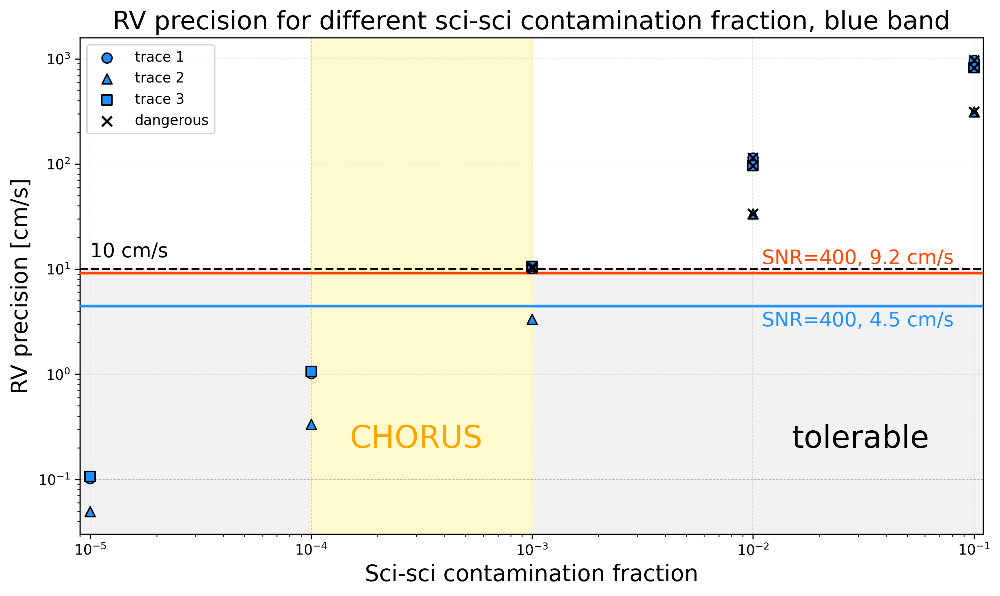

In [412]:
plt.figure(figsize=(10, 6), dpi=300)
# turn m/s to cm/s
for i in range(len(scisci_frac_values)):
    # trace 1
    trace1 = plt.scatter(scisci_frac_values[i], rv_std1_blue[i]*100, marker='o', color='dodgerblue', edgecolors='k', s=50, zorder=5)
    # trace 2
    trace2 = plt.scatter(scisci_frac_values[i], rv_std2_blue[i]*100, marker='^', color='dodgerblue', edgecolors='k', s=50, zorder=5)
    # trace 3
    trace3 = plt.scatter(scisci_frac_values[i], rv_std3_blue[i]*100, marker='s', color='dodgerblue', edgecolors='k', s=50, zorder=5)

    # plot the dangerous points
    if rv_std1_blue[i] >= 0.1:
        dangerous = plt.scatter(scisci_frac_values[i], rv_std1_blue[i]*100, color='k', marker='x', linewidths=1.5, s=50, zorder=10)
    if rv_std2_blue[i] >= 0.1:
        plt.scatter(scisci_frac_values[i], rv_std2_blue[i]*100, color='k', marker='x', linewidths=1.5, s=50, zorder=10)
    if rv_std3_blue[i] >= 0.1:
        plt.scatter(scisci_frac_values[i], rv_std3_blue[i]*100, color='k', marker='x', linewidths=1.5, s=50, zorder=10)

# CHORUS setting
plt.axvspan(1e-4, 1e-3, color='lemonchiffon', zorder=1)
plt.text(1.5e-4, 0.2, 'CHORUS', fontsize=22, color='orange', zorder=10)

# mark 10cm/s
plt.axhline(y=10, color='k', linestyle='--', linewidth=1.5, zorder=1)
plt.text(10**-5, 13, '10 cm/s', fontsize=14, color='k', zorder=10)
plt.axhspan(0, 10, color='gray', alpha=0.1, zorder=0)
plt.text(0.15e-1, 0.2, 'tolerable', fontsize=22, color='black', zorder=10)

# mark precision at SNR=400
plt.axhline(pre_red_12[3]*100, color='orangered', linewidth=2, zorder=4)
plt.axhline(pre_blue_12[3]*100, color='dodgerblue', linewidth=2, zorder=4)
plt.text(0.11e-1, pre_red_12[3]*100+2, f'SNR=400, {pre_red_12[3]*100:.1f} cm/s', fontsize=14, color='orangered', zorder=10)
plt.text(0.11e-1, pre_blue_12[3]*100-1.6, f'SNR=400, {pre_blue_12[3]*100:.1f} cm/s', fontsize=14, color='dodgerblue', zorder=10)

plt.xscale('log')
plt.yscale('log')
plt.xlim(0.9e-5, 1.1e-1);
plt.xlabel('Sci-sci contamination fraction', fontsize=16)
plt.ylabel('RV precision [cm/s]', fontsize=16)
plt.title(f"RV precision for different sci-sci contamination fraction, blue band", fontsize=18)
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.legend([trace1, trace2, trace3, dangerous], ['trace 1', 'trace 2', 'trace 3', 'dangerous'], loc='upper left', handletextpad=1, fontsize=10)
plt.tight_layout()

In [1]:
# plot the spectrum of the first order
snr = 100
scisci_frac = 1e-1
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
filename = f"{scisci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [540.5, 541]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

plt.figure(figsize=(10, 5), dpi=300)
plt.scatter(data['wavelength'][-1, 0, :], data['flux'][-1, 0, :], s=5, color='c', label='trace 1')
plt.scatter(data['wavelength'][-1, 1, :], data['flux'][-1, 1, :], s=5, color='m', label='trace 2')
plt.scatter(data['wavelength'][-1, 2, :], data['flux'][-1, 2, :], s=5, color='b', label='trace 3')
plt.legend(fontsize=12)
plt.xlim(540.5, 541)
plt.xlabel('Wavelength [nm]', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title(f"Flux for SNR={snr} in the {band} band, sci-sci contamination fraction {scisci_frac}", fontsize=18)
plt.tight_layout()

plt.figure(figsize=(10, 5), dpi=300)
plt.scatter(range(1, 8001), data['flux'][-1, 0, :], s=5, color='c', label ='trace 1')
plt.scatter(range(1, 8001), data['flux'][-1, 1, :], s=5, color='m', label='trace 2')
plt.scatter(range(1, 8001), data['flux'][-1, 2, :], s=5, color='b', label='trace 3')
plt.legend(fontsize=12)
plt.xlim(pix_ind[0], pix_ind[1])
plt.xlabel('Pixel number', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title(f"Flux for SNR={snr} in the {band} band, sci-sci contamination fraction {scisci_frac}", fontsize=18)
plt.tight_layout()

NameError: name 'os' is not defined

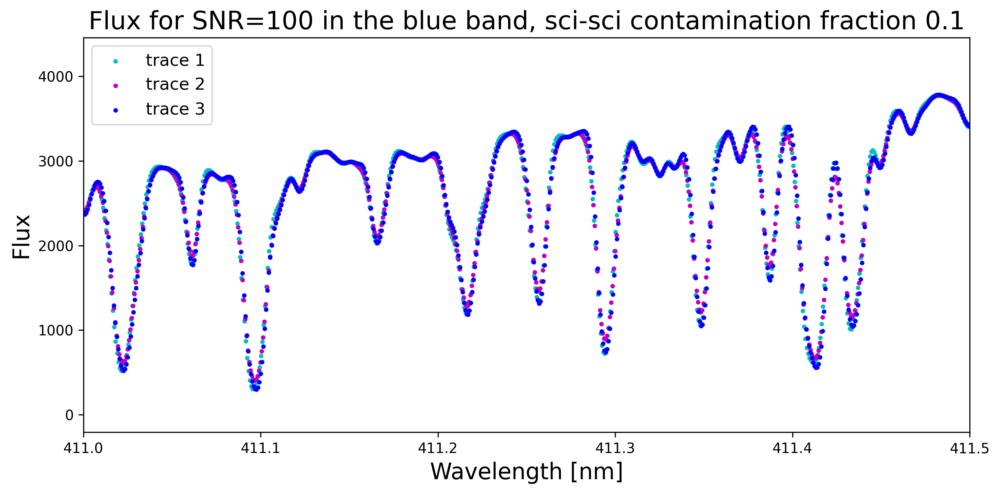

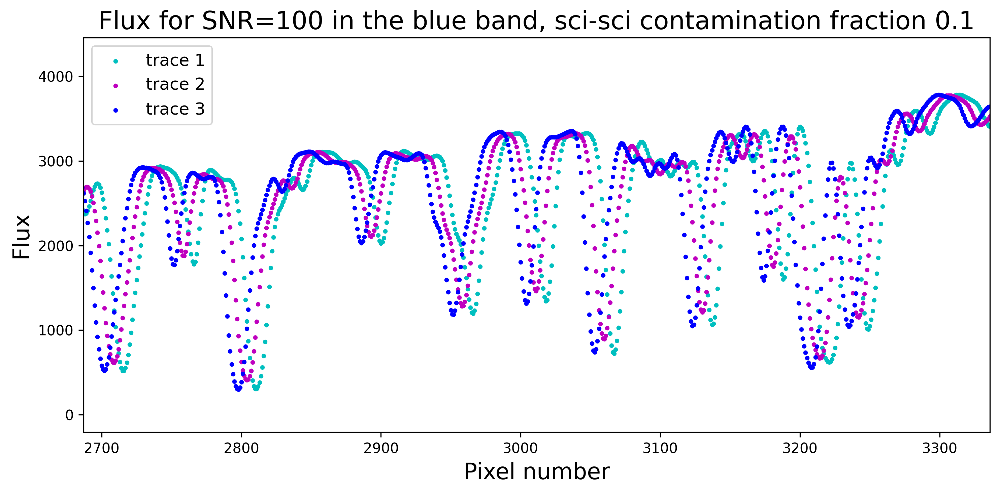

In [16]:
# plot the spectrum of the first order
snr = 100
scisci_frac = 1e-1
band = 'blue'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
filename = f"{scisci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [411, 411.5]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

plt.figure(figsize=(10, 5), dpi=300)
plt.scatter(data['wavelength'][-1, 0, :], data['flux'][-1, 0, :], s=5, color='c', label='trace 1')
plt.scatter(data['wavelength'][-1, 1, :], data['flux'][-1, 1, :], s=5, color='m', label='trace 2')
plt.scatter(data['wavelength'][-1, 2, :], data['flux'][-1, 2, :], s=5, color='b', label='trace 3')
plt.legend(fontsize=12)
plt.xlim(411, 411.5)
plt.xlabel('Wavelength [nm]', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title(f"Flux for SNR={snr} in the {band} band, sci-sci contamination fraction {scisci_frac}", fontsize=18)
plt.tight_layout()

plt.figure(figsize=(10, 5), dpi=300)
plt.scatter(range(1, 8001), data['flux'][-1, 0, :], s=5, color='c', label ='trace 1')
plt.scatter(range(1, 8001), data['flux'][-1, 1, :], s=5, color='m', label='trace 2')
plt.scatter(range(1, 8001), data['flux'][-1, 2, :], s=5, color='b', label='trace 3')
plt.legend(fontsize=12)
plt.xlim(pix_ind[0], pix_ind[1])
plt.xlabel('Pixel number', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title(f"Flux for SNR={snr} in the {band} band, sci-sci contamination fraction {scisci_frac}", fontsize=18)
plt.tight_layout()

## 4. CHORUS setting

SNR=100, RV median in the red band: 0.11529491792524962m/s, std: 0.4468531762525376m/s
SNR=100, RV median in the blue band: 0.017234085429192633m/s, std: 0.2296618792716984m/s


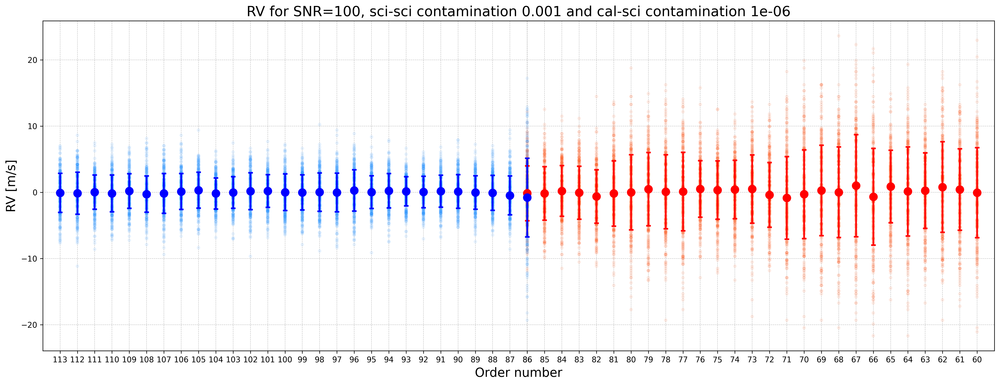

In [6]:
SNR_values = np.arange(100, 801, 100)
scisci_frac_values = [1e-3, 1e-4]
nspec = 100
R = 120000

# load and plot SNR=100
snr = 100
scisci_frac = 1e-3
rv_all_red = np.zeros((nspec, len(order_num_red), 3))
rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
plt.figure(figsize=(18, 7), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_CHORUS/snr{snr}")
    filename = f"{scisci_frac}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_red[ispec, :, :] = rv
    plt.scatter(order_num['red'], rv[:, 0], s=20, edgecolors='none', c='orangered', alpha=0.1, zorder=3)
    plt.scatter(order_num['red'], rv[:, 1], s=20, edgecolors='none', c='orangered', alpha=0.1, zorder=3)
    plt.scatter(order_num['red'], rv[:, 2], s=20, edgecolors='none', c='orangered', alpha=0.1, zorder=3)
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
    filename = f"{R}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_blue[ispec, :, :] = rv
    plt.scatter(order_num['blue'], rv[:, 0], s=20, edgecolors='none', c='dodgerblue', alpha=0.1, zorder=3)
    plt.scatter(order_num['blue'], rv[:, 1], s=20, edgecolors='none', c='dodgerblue', alpha=0.1, zorder=3)
    plt.scatter(order_num['blue'], rv[:, 2], s=20, edgecolors='none', c='dodgerblue', alpha=0.1, zorder=3)

# concatenate the red band into the shape of (nspec*3, len(order)), joining 3 traces for one order
# calculate the median and std of each order, combining three traces for one order
# red band
rv_all_red_transformed = np.hstack(rv_all_red[:, :, :])
rv_median_red = np.median(rv_all_red_transformed, axis=1)
rv_std_red = np.std(rv_all_red_transformed, axis=1)
plt.errorbar(order_num['red'], rv_median_red, yerr=rv_std_red, fmt='o', color='red', ms=10, elinewidth=2, capsize=3, capthick=2, label='Red band', zorder=5)
# blue band
rv_all_blue_transformed = np.hstack(rv_all_blue[:, :, :])
rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
rv_std_blue = np.std(rv_all_blue_transformed, axis=1)
plt.errorbar(order_num['blue'], rv_median_blue, yerr=rv_std_blue, fmt='o', color='blue', ms=10, elinewidth=2, capsize=3, capthick=2, label='Blue band', zorder=5)

print(f"SNR={snr}, RV median in the red band: {np.median(rv_median_red)}m/s, std: {np.std(rv_median_red)}m/s")
print(f"SNR={snr}, RV median in the blue band: {np.median(rv_median_blue)}m/s, std: {np.std(rv_median_blue)}m/s")

# plt.yscale('log')
# plt.ylim(-5, 5)
plt.xlim(59, 114)
plt.gca().invert_xaxis()
plt.xticks(order, fontsize=10);  # Suppress output
plt.xlabel('Order number', fontsize=16);
plt.ylabel('RV [m/s]', fontsize=16);
plt.title(f"RV for SNR={snr}, sci-sci contamination {scisci_frac} and cal-sci contamination {1e-6}", fontsize=18);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.tight_layout()

In [7]:
# extract RV precision information
def rv_precision_cont(snr_values, scisci_frac):

    pre_red = np.zeros_like(snr_values, dtype=float)
    pre_blue = np.zeros_like(snr_values, dtype=float)

    for i, snr in enumerate(snr_values):
        rv_all_red = np.zeros((nspec, len(order_num_red), 3))
        rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
        for ispec in range(nspec):
            output_folder = os.path.join(pwd, f"output/synfile_CHORUS/snr{snr}")
            filename = f"{scisci_frac}_{ispec}_red.npz"
            filepath = os.path.join(output_folder, filename)
            data = np.load(filepath)
            rv = data['RV']
            rv_all_red[ispec, :, :] = rv
        for ispec in range(nspec):
            output_folder = os.path.join(pwd, f"output/synfile_CHORUS/snr{snr}")
            filename = f"{scisci_frac}_{ispec}_blue.npz"
            filepath = os.path.join(output_folder, filename)
            data = np.load(filepath)
            rv = data['RV']
            rv_all_blue[ispec, :, :] = rv
        # red
        rv_all_red_transformed = np.hstack(rv_all_red[:, :, :])
        rv_median_red = np.median(rv_all_red_transformed, axis=1)
        # blue
        rv_all_blue_transformed = np.hstack(rv_all_blue[:, :, :])
        rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
        # precision
        pre_red[i] = np.std(rv_median_red)
        pre_blue[i] = np.std(rv_median_blue)

    return pre_red, pre_blue

pre_red_conservative, pre_blue_conservative = rv_precision_cont(SNR_values, 1e-3)
pre_red_optimize, pre_blue_optimize = rv_precision_cont(SNR_values, 1e-4)

In [8]:
np.savez('rv_precision_cont.npz', pre_red_conservative=pre_red_conservative, pre_blue_conservative=pre_blue_conservative, pre_red_optimize=pre_red_optimize, pre_blue_optimize=pre_blue_optimize)

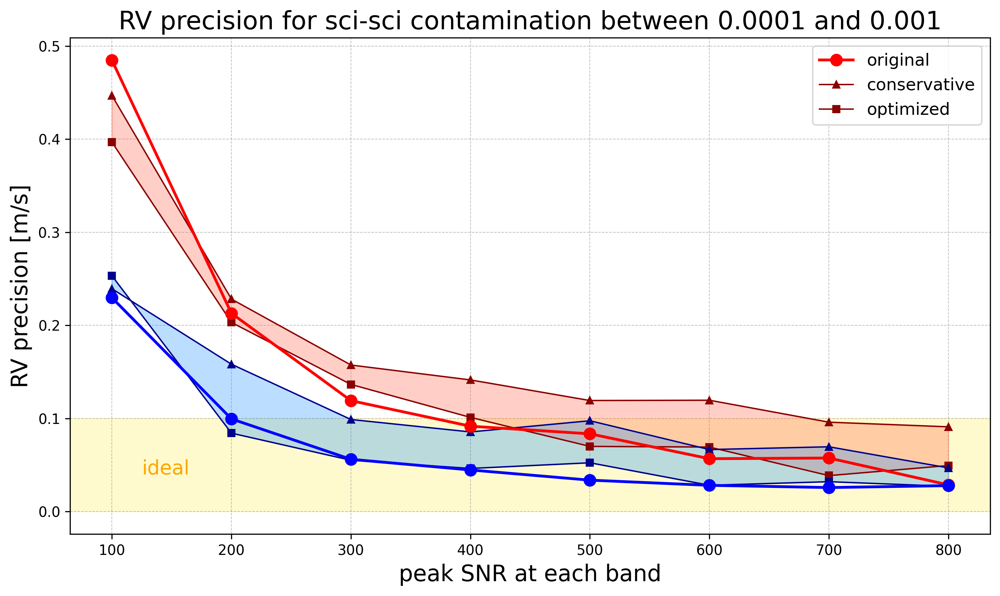

In [416]:
plt.figure(figsize=(10, 6), dpi=300)
original = plt.plot(SNR_values, pre_red_12, 'o-', label='R=120k', color='r', linewidth=2, ms=8, zorder=10)
conservative = plt.plot(SNR_values, pre_red_conservative, '^-', label='conservative', linewidth=1, ms=5, color='darkred', zorder=6)
optimize = plt.plot(SNR_values, pre_red_optimize, 's-', label='optimized', linewidth=1, ms=5, color='darkred', zorder=6)
plt.fill_between(SNR_values, pre_red_conservative, pre_red_optimize, color='tomato', alpha=0.3, zorder=3)

original = plt.plot(SNR_values, pre_blue_12, 'o-', label='R=120k', color='b', linewidth=2, ms=8, zorder=10)
conservative = plt.plot(SNR_values, pre_blue_conservative, '^-', label='conservative', linewidth=1, ms=5, color='darkblue', zorder=6)
optimize = plt.plot(SNR_values, pre_blue_optimize, 's-', label='optimized', linewidth=1, ms=5, color='darkblue', zorder=6)
plt.fill_between(SNR_values, pre_blue_conservative, pre_blue_optimize, color='dodgerblue', alpha=0.3, zorder=3)

# mark <10cm/s area
plt.axhspan(0, 0.1, color='lemonchiffon', zorder=0)
plt.text(125, 0.04, 'ideal', fontsize=14, color='orange')

plt.xticks(SNR_values, fontsize=10);  # Suppress output
# plt.yticks(np.arange(0, 1.2, 0.1))
plt.xlabel('peak SNR at each band', fontsize=16);
plt.ylabel('RV precision [m/s]', fontsize=16);
plt.title(f"RV precision for sci-sci contamination between 0.0001 and 0.001", fontsize=18);
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0);
plt.legend(['original', 'conservative', 'optimized'], fontsize=12)
plt.tight_layout()